# FIFA 20

**Problem Statement:**
* The challenge lies in developing a machine learning model that can accurately predict player performance in the FIFA 20 game. This prediction model will utilize various player attributes and historical data to simulate player behavior and performance within the game environment.

**Solution:**
* By leveraging machine learning algorithms and historical player data, we can create a player performance prediction system that enhances the realism and authenticity of the FIFA 20 gameplay experience. The developed model will provide valuable insights into how different attributes and skills influence player performance, allowing gamers to make informed decisions about team composition, tactics, and transfers within the game.

## Import Libraries

In [1]:
# Loading the required liabries
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

## Loading Datasets

In [2]:
#Import the fifa dataset
data = pd.read_csv("players_20.csv")

In [3]:
data

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


## Checking Information

In [4]:
#information about dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


## Basic Stats

In [5]:
# Basic stats about the dataset
data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


In [6]:
# Names of all the columns
for i in data.columns:
    print(i)

sofifa_id
player_url
short_name
long_name
age
dob
height_cm
weight_kg
nationality
club
overall
potential
value_eur
wage_eur
player_positions
preferred_foot
international_reputation
weak_foot
skill_moves
work_rate
body_type
real_face
release_clause_eur
player_tags
team_position
team_jersey_number
loaned_from
joined
contract_valid_until
nation_position
nation_jersey_number
pace
shooting
passing
dribbling
defending
physic
gk_diving
gk_handling
gk_kicking
gk_reflexes
gk_speed
gk_positioning
player_traits
attacking_crossing
attacking_finishing
attacking_heading_accuracy
attacking_short_passing
attacking_volleys
skill_dribbling
skill_curve
skill_fk_accuracy
skill_long_passing
skill_ball_control
movement_acceleration
movement_sprint_speed
movement_agility
movement_reactions
movement_balance
power_shot_power
power_jumping
power_stamina
power_strength
power_long_shots
mentality_aggression
mentality_interceptions
mentality_positioning
mentality_vision
mentality_penalties
mentality_composure
defe

In [7]:
# displaying all coulumns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB
None


In [8]:
data.dtypes

sofifa_id                       int64
player_url                     object
short_name                     object
long_name                      object
age                             int64
dob                            object
height_cm                       int64
weight_kg                       int64
nationality                    object
club                           object
overall                         int64
potential                       int64
value_eur                       int64
wage_eur                        int64
player_positions               object
preferred_foot                 object
international_reputation        int64
weak_foot                       int64
skill_moves                     int64
work_rate                      object
body_type                      object
real_face                      object
release_clause_eur            float64
player_tags                    object
team_position                  object
team_jersey_number            float64
loaned_from 

## Clarifying Null Values

In [9]:
# Check all the null values in dataset
data.isnull().sum()

sofifa_id                         0
player_url                        0
short_name                        0
long_name                         0
age                               0
dob                               0
height_cm                         0
weight_kg                         0
nationality                       0
club                              0
overall                           0
potential                         0
value_eur                         0
wage_eur                          0
player_positions                  0
preferred_foot                    0
international_reputation          0
weak_foot                         0
skill_moves                       0
work_rate                         0
body_type                         0
real_face                         0
release_clause_eur             1298
player_tags                   16779
team_position                   240
team_jersey_number              240
loaned_from                   17230
joined                      

In [10]:
#using fillna method to get null values
data.fillna(method='ffill', inplace=True) 

In [11]:
data.loc[data['release_clause_eur'].isnull()==True, 'release_clause_eur']=data['release_clause_eur'].mean()

In [12]:
data['release_clause_eur'].isnull().sum()

0

In [13]:
data.loc[data['player_tags'].isnull()==True, 'player_tags']=data['player_tags'].mode()

In [14]:
data['player_tags'].isnull().sum()

0

In [15]:
data.loc[data['team_position'].isnull()==True, 'team_position']=data['team_position'].mode()

In [16]:
data['team_position'].isnull().sum()

0

In [17]:
data.loc[data['team_jersey_number'].isnull()==True, 'team_jersey_number']=data['team_jersey_number'].mean()

In [18]:
data['team_jersey_number'].isnull().sum()

0

In [19]:
data.loc[data['loaned_from'].isnull()==True, 'loaned_from']=data['loaned_from'].mode()

In [20]:
data['loaned_from'].fillna(method='bfill',inplace=True) #only this used bfill fillna method to get null values

In [21]:
data['loaned_from'].isnull().sum()

0

In [22]:
data.loc[data['joined'].isnull()==True, 'joined']=data['joined'].mode()

In [23]:
data['joined'].isnull().sum()

0

In [24]:
data.loc[data['contract_valid_until'].isnull()==True, 'contract_valid_until']=data['contract_valid_until'].mean()

In [25]:
data['contract_valid_until'].isnull().sum()

0

In [26]:
data.loc[data['nation_position'].isnull()==True, 'nation_position']=data['nation_position'].mode()

In [27]:
data['nation_position'].isnull().sum()

0

In [28]:
data.loc[data['nation_jersey_number'].isnull()==True, 'nation_jersey_number']=data['nation_jersey_number'].mean()

In [29]:
data['nation_jersey_number'].isnull().sum()

0

In [30]:
data.loc[data['pace'].isnull()==True, 'pace']=data['pace'].mean()

In [31]:
data['pace'].isnull().sum()

0

In [32]:
data.loc[data['shooting'].isnull()==True, 'shooting']=data['shooting'].mean()

In [33]:
data['shooting'].isnull().sum()

0

In [34]:
data.loc[data['passing'].isnull()==True, 'passing']=data['passing'].mean()

In [35]:
data['passing'].isnull().sum()

0

In [36]:
data.loc[data['dribbling'].isnull()==True, 'dribbling']=data['dribbling'].mean()

In [37]:
data['dribbling'].isnull().sum()

0

In [38]:
data.loc[data['defending'].isnull()==True, 'defending']=data['defending'].mean()

In [39]:
data['defending'].isnull().sum()

0

In [40]:
data.loc[data['physic'].isnull()==True, 'physic']=data['physic'].mean()

In [41]:
data['physic'].isnull().sum()

0

In [42]:
data.loc[data['gk_diving'].isnull()==True, 'gk_diving']=data['gk_diving'].mean()

In [43]:
data['gk_diving'].isnull().sum()

0

In [44]:
data.loc[data['gk_handling'].isnull()==True, 'gk_handling']=data['gk_handling'].mean()

In [45]:
data['gk_handling'].isnull().sum()

0

In [46]:
data.loc[data['gk_kicking'].isnull()==True, 'gk_kicking']=data['gk_kicking'].mean()

In [47]:
data['gk_kicking'].isnull().sum()

0

In [48]:
data.loc[data['gk_reflexes'].isnull()==True, 'gk_reflexes']=data['gk_reflexes'].mean()

In [49]:
data['gk_reflexes'].isnull().sum()

0

In [50]:
data.loc[data['gk_speed'].isnull()==True, 'gk_speed']=data['gk_speed'].mean()

In [51]:
data['gk_speed'].isnull().sum()

0

In [52]:
data.loc[data['gk_positioning'].isnull()==True, 'gk_positioning']=data['gk_positioning'].mean()

In [53]:
data['gk_positioning'].isnull().sum()

0

In [54]:
data.loc[data['player_traits'].isnull()==True, 'player_traits']=data['player_traits'].mode()

In [55]:
data['player_traits'].isnull().sum()

0

In [56]:
data.loc[data['ls'].isnull()==True, 'ls']=data['ls'].mode()

In [57]:
data['ls'].isnull().sum()

0

In [58]:
data.loc[data['st'].isnull()==True, 'st']=data['st'].mode()

In [59]:
data['st'].isnull().sum()

0

In [60]:
data.loc[data['rs'].isnull()==True, 'rs']=data['rs'].mode()

In [61]:
data['rs'].isnull().sum()

0

In [62]:
data.loc[data['lw'].isnull()==True, 'lw']=data['lw'].mode()

In [63]:
data['lw'].isnull().sum()

0

In [64]:
data.loc[data['lf'].isnull()==True, 'lf']=data['lf'].mode()

In [65]:
data['lf'].isnull().sum()

0

In [66]:
data.loc[data['cf'].isnull()==True, 'cf']=data['cf'].mode()

In [67]:
data['cf'].isnull().sum()

0

In [68]:
data.loc[data['rf'].isnull()==True, 'rf']=data['rf'].mode()

In [69]:
data['rf'].isnull().sum()

0

In [70]:
data.loc[data['rw'].isnull()==True, 'rw']=data['rw'].mode()

In [71]:
data['rw'].isnull().sum()

0

In [72]:
data.loc[data['lam'].isnull()==True, 'lam']=data['lam'].mode()

In [73]:
data['lam'].isnull().sum()

0

In [74]:
data.loc[data['cam'].isnull()==True, 'cam']=data['cam'].mode()

In [75]:
data['cam'].isnull().sum()

0

In [76]:
data.loc[data['ram'].isnull()==True, 'ram']=data['ram'].mode()

In [77]:
data['ram'].isnull().sum()

0

In [78]:
data.loc[data['lm'].isnull()==True, 'lm']=data['lm'].mode()

In [79]:
data['lm'].isnull().sum()

0

In [80]:
data.loc[data['lcm'].isnull()==True, 'lcm']=data['lcm'].mode()

In [81]:
data['lcm'].isnull().sum()

0

In [82]:
data.loc[data['cm'].isnull()==True, 'cm']=data['cm'].mode()

In [83]:
data['cm'].isnull().sum()

0

In [84]:
data.loc[data['rcm'].isnull()==True, 'rcm']=data['rcm'].mode()

In [85]:
data['rcm'].isnull().sum()

0

In [86]:
data.loc[data['rm'].isnull()==True, 'rm']=data['rm'].mode()

In [87]:
data['rm'].isnull().sum()

0

In [88]:
data.loc[data['lwb'].isnull()==True, 'lwb']=data['lwb'].mode()

In [89]:
data['lwb'].isnull().sum()

0

In [90]:
data.loc[data['ldm'].isnull()==True, 'ldm']=data['ldm'].mode()

In [91]:
data['ldm'].isnull().sum()

0

In [92]:
data.loc[data['cdm'].isnull()==True, 'cdm']=data['cdm'].mode()

In [93]:
data['cdm'].isnull().sum()

0

In [94]:
data.loc[data['rdm'].isnull()==True, 'rdm']=data['rdm'].mode()

In [95]:
data['rdm'].isnull().sum()

0

In [96]:
data.loc[data['rwb'].isnull()==True, 'rwb']=data['rwb'].mode()

In [97]:
data['rwb'].isnull().sum()

0

In [98]:
data.loc[data['lb'].isnull()==True, 'lb']=data['lb'].mode()

In [99]:
data['lb'].isnull().sum()

0

In [100]:
data.loc[data['lcb'].isnull()==True, 'lcb']=data['lcb'].mode()

In [101]:
data['lcb'].isnull().sum()

0

In [102]:
data.loc[data['cb'].isnull()==True, 'cb']=data['cb'].mode()

In [103]:
data['cb'].isnull().sum()

0

In [104]:
data.loc[data['rcb'].isnull()==True, 'rcb']=data['rcb'].mode()

In [105]:
data['rcb'].isnull().sum()

0

In [106]:
data.loc[data['rb'].isnull()==True, 'rb']=data['rb'].mode()

In [107]:
data['rb'].isnull().sum()

0

In [108]:
# Check all the null values in dataset
data.isnull().sum()

sofifa_id                     0
player_url                    0
short_name                    0
long_name                     0
age                           0
dob                           0
height_cm                     0
weight_kg                     0
nationality                   0
club                          0
overall                       0
potential                     0
value_eur                     0
wage_eur                      0
player_positions              0
preferred_foot                0
international_reputation      0
weak_foot                     0
skill_moves                   0
work_rate                     0
body_type                     0
real_face                     0
release_clause_eur            0
player_tags                   0
team_position                 0
team_jersey_number            0
loaned_from                   0
joined                        0
contract_valid_until          0
nation_position               0
nation_jersey_number          0
pace    

## Saving Datasets

In [109]:
# saving modified dataset
data.to_csv('fifa_20.csv', index=False)

In [110]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')

## Task 1:-Prepare a complete data analysis report on the given data.

## Import Librabries

In [111]:
# Loading the required liabries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Loading new datset

In [112]:
# Import the fifa dataset
fifa=pd.read_csv('fifa_20.csv')
fifa

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


In [113]:
# Top 5 records of the dataset
fifa.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


### Checking Shape of Dataset

In [114]:
# Looking at the number of rows and columns in the dataset
fifa.shape

(18278, 104)

In [115]:
# Names of all the columns
fifa.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=104)

In [116]:
# Names of all the columns
for i in fifa.columns:
    print(i)

sofifa_id
player_url
short_name
long_name
age
dob
height_cm
weight_kg
nationality
club
overall
potential
value_eur
wage_eur
player_positions
preferred_foot
international_reputation
weak_foot
skill_moves
work_rate
body_type
real_face
release_clause_eur
player_tags
team_position
team_jersey_number
loaned_from
joined
contract_valid_until
nation_position
nation_jersey_number
pace
shooting
passing
dribbling
defending
physic
gk_diving
gk_handling
gk_kicking
gk_reflexes
gk_speed
gk_positioning
player_traits
attacking_crossing
attacking_finishing
attacking_heading_accuracy
attacking_short_passing
attacking_volleys
skill_dribbling
skill_curve
skill_fk_accuracy
skill_long_passing
skill_ball_control
movement_acceleration
movement_sprint_speed
movement_agility
movement_reactions
movement_balance
power_shot_power
power_jumping
power_stamina
power_strength
power_long_shots
mentality_aggression
mentality_interceptions
mentality_positioning
mentality_vision
mentality_penalties
mentality_composure
defe

In [117]:
# Basic stats about the dataset
fifa.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


In [118]:
# Datatypes of all the columns of the dataset
fifa.dtypes

sofifa_id      int64
player_url    object
short_name    object
long_name     object
age            int64
               ...  
lb            object
lcb           object
cb            object
rcb           object
rb            object
Length: 104, dtype: object

In [119]:
# To avoid settingWithCopyWarning
pd.options.mode.chained_assignment=None

In [120]:
# Extract required columns from the main datatset and make it another dataset named fifa
fifa=fifa[['short_name','age','dob','height_cm','weight_kg','nationality','club','wage_eur','preferred_foot','international_reputation','pace','shooting','passing','dribbling','defending','gk_diving','gk_handling','gk_kicking','gk_speed','gk_reflexes']]
fifa

,short_name,age,dob,height_cm,weight_kg,nationality,club,wage_eur,preferred_foot,international_reputation,pace,shooting,passing,dribbling,defending,gk_diving,gk_handling,gk_kicking,gk_speed,gk_reflexes
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,565000,Left,5,87.0,92.0,92.0,96.0,39.0,66.877811,64.358577,63.080383,38.425609,68.017073
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,405000,Right,5,90.0,93.0,82.0,89.0,35.0,66.877811,64.358577,63.080383,38.425609,68.017073
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,290000,Right,5,91.0,85.0,87.0,95.0,32.0,66.877811,64.358577,63.080383,38.425609,68.017073
3,J. Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,125000,Right,3,91.0,85.0,87.0,95.0,32.0,87.000000,92.000000,78.000000,52.000000,89.000000
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,470000,Right,4,91.0,83.0,86.0,94.0,35.0,87.000000,92.000000,78.000000,52.000000,89.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,Shao Shuai,22,1997-03-10,186,79,China PR,Beijing Renhe FC,2000,Right,1,57.0,23.0,28.0,33.0,47.0,54.000000,51.000000,46.000000,24.000000,45.000000
18274,Xiao Mingjie,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,2000,Right,1,58.0,24.0,33.0,35.0,48.0,54.000000,51.000000,46.000000,24.000000,45.000000
18275,Zhang Wei,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,1000,Right,1,54.0,35.0,44.0,45.0,48.0,54.000000,51.000000,46.000000,24.000000,45.000000
18276,Wang Haijian,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,1000,Right,1,59.0,35.0,47.0,47.0,45.0,54.000000,51.000000,46.000000,24.000000,45.000000


In [121]:
fifa.shape

(18278, 20)

### Which country has the most number of players ?

In [122]:
# Name of top countries and the number of players in each countries
fifa['nationality'].value_counts()

England                1667
Germany                1216
Spain                  1035
France                  984
Argentina               886
                       ... 
Liberia                   1
São Tomé & Príncipe       1
Puerto Rico               1
Bahrain                   1
Indonesia                 1
Name: nationality, Length: 162, dtype: int64

In [123]:
# Top 5 countries and number of players in each country.
fifa['nationality'].value_counts()[0:5]

England      1667
Germany      1216
Spain        1035
France        984
Argentina     886
Name: nationality, dtype: int64

In [124]:
# Top 5 countries having most number of players
list(fifa['nationality'].value_counts()[0:5].keys())

['England', 'Germany', 'Spain', 'France', 'Argentina']

In [125]:
# Number of the players in the top 5 countries having most number of players. 
list(fifa['nationality'].value_counts()[0:5])

[1667, 1216, 1035, 984, 886]

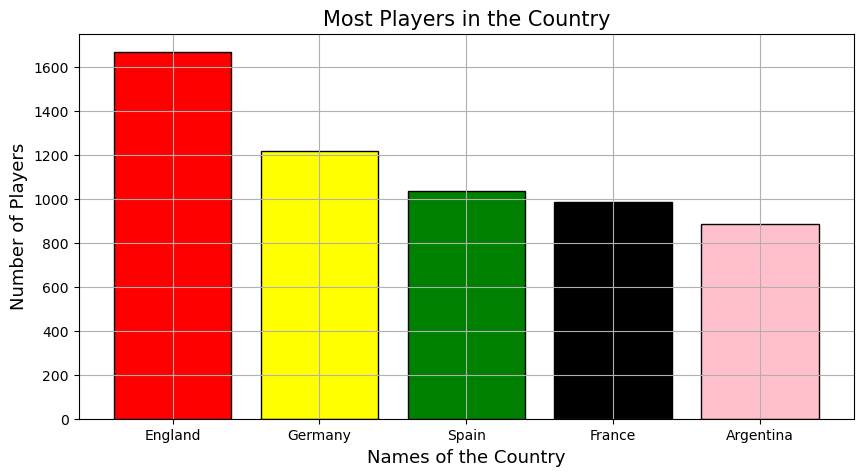

In [126]:
# Bar-plot of top 5 countries with most number of players.
plt.figure(figsize=(10,5))
plt.bar(list(fifa['nationality'].value_counts()[0:5].keys()),list(fifa['nationality'].value_counts()[0:5]),color=['red','yellow','green','black','pink','orange'],ec='black',lw=1)
plt.grid(True)
plt.title("Most Players in the Country",fontsize=15)
plt.xlabel('Names of the Country',fontsize=13)
plt.ylabel('Number of Players',fontsize=13)
plt.show()

### Which player has the highest salary ?

In [127]:
# Make a new dataset named player_salary of short_name and wage_eur columns.
player_salary=fifa[['short_name','wage_eur']]
player_salary

,short_name,wage_eur
0,L. Messi,565000
1,Cristiano Ronaldo,405000
2,Neymar Jr,290000
3,J. Oblak,125000
4,E. Hazard,470000
...,...,...
18273,Shao Shuai,2000
18274,Xiao Mingjie,2000
18275,Zhang Wei,1000
18276,Wang Haijian,1000


In [128]:
# Head of the dataset.
player_salary.head()

,short_name,wage_eur
0,L. Messi,565000
1,Cristiano Ronaldo,405000
2,Neymar Jr,290000
3,J. Oblak,125000
4,E. Hazard,470000


In [129]:
# Sort the dataset in the descending order of their salary.
player_salary=player_salary.sort_values(by='wage_eur',ascending=False)
player_salary

,short_name,wage_eur
0,L. Messi,565000
4,E. Hazard,470000
1,Cristiano Ronaldo,405000
5,K. De Bruyne,370000
22,A. Griezmann,370000
...,...,...
565,J. Serendero,0
1868,M. Mevlja,0
14723,R. Fernández,0
16356,H. Ivanov,0


In [130]:
# Top 5 records of the dataset.
player_salary.head()

,short_name,wage_eur
0,L. Messi,565000
4,E. Hazard,470000
1,Cristiano Ronaldo,405000
5,K. De Bruyne,370000
22,A. Griezmann,370000


In [131]:
# Names of the top 5 players with highest salary.
list(player_salary['short_name'][0:5])

['L. Messi', 'E. Hazard', 'Cristiano Ronaldo', 'K. De Bruyne', 'A. Griezmann']

In [132]:
# Top 5 highest salary.
list(player_salary['wage_eur'][0:5])

[565000, 470000, 405000, 370000, 370000]

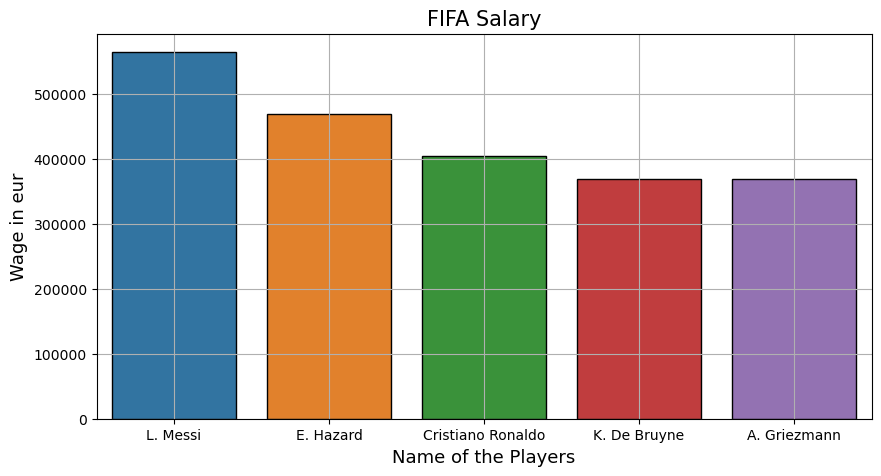

In [133]:
# Bar-plot of top 5 players with highest salary.
plt.figure(figsize=(10,5))
sns.barplot(x=list(player_salary['short_name'][0:5]),y=list(player_salary['wage_eur'][0:5]),ec='black',lw=1)
plt.title("FIFA Salary",fontsize=15)
plt.xlabel("Name of the Players",fontsize=13)
plt.ylabel("Wage in eur",fontsize=13)
plt.grid(True)
plt.show()

### What is the range of the salary of most of the players in the world ?

In [134]:
# wage_eur column of the dataset.
player_salary['wage_eur']

0        565000
4        470000
1        405000
5        370000
22       370000
          ...  
565           0
1868          0
14723         0
16356         0
3053          0
Name: wage_eur, Length: 18278, dtype: int64

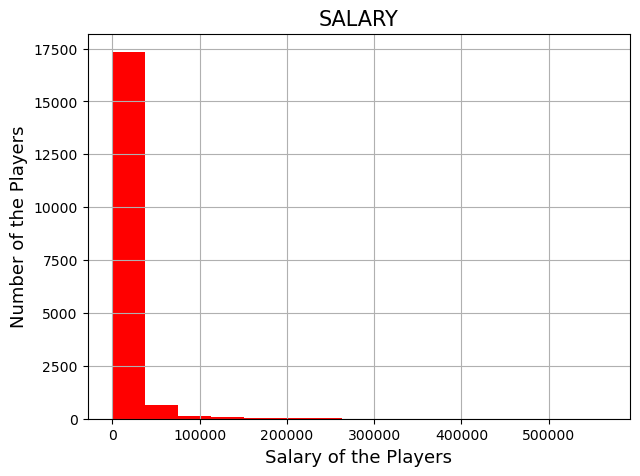

In [135]:
# Histogram for the wage_eur column of the dataset.
plt.figure(figsize=(7,5))
plt.hist(player_salary['wage_eur'],bins=15,color='red')
plt.title("SALARY",fontsize=15)
plt.ylabel('Number of the Players',fontsize=13)
plt.xlabel('Salary of the Players',fontsize=13)
plt.grid(True)
plt.show()

In [136]:
# Dataset from player_salary where wage_eur is less than 50,000 .
player_salary[player_salary['wage_eur'] < 50000]

,short_name,wage_eur
283,F. Kostić,49000
755,D. Rice,49000
947,T. Cairney,49000
879,Gervinho,49000
933,M. Hitz,49000
...,...,...
565,J. Serendero,0
1868,M. Mevlja,0
14723,R. Fernández,0
16356,H. Ivanov,0


In [137]:
# Percentage of the players who have salary less than 50,000 eur.
17688/18278*100

96.77207571944415

### Who is the most tallest player in the world ?

In [138]:
# Make a new dataset named player_height of short_name and height_cm columns.
player_height=fifa[['short_name','height_cm']]
player_height

,short_name,height_cm
0,L. Messi,170
1,Cristiano Ronaldo,187
2,Neymar Jr,175
3,J. Oblak,188
4,E. Hazard,175
...,...,...
18273,Shao Shuai,186
18274,Xiao Mingjie,177
18275,Zhang Wei,186
18276,Wang Haijian,185


In [139]:
# Head of the dataset.
player_height.head()

,short_name,height_cm
0,L. Messi,170
1,Cristiano Ronaldo,187
2,Neymar Jr,175
3,J. Oblak,188
4,E. Hazard,175


In [140]:
# Sort the dataset in the descending order of their height.
player_height=player_height.sort_values(by='height_cm',ascending=False)
player_height

,short_name,height_cm
9208,T. Holý,205
8200,A. Ba,203
12808,A. Chapman,203
3121,C. Pantilimon,203
12864,M. Qvist,203
...,...,...
1496,M. Moralez,158
4243,C. Songkrasin,158
16929,J. Nisbet,158
3898,J. Plata,157


In [141]:
# Top 5 records of the dataset.
player_height.head()

,short_name,height_cm
9208,T. Holý,205
8200,A. Ba,203
12808,A. Chapman,203
3121,C. Pantilimon,203
12864,M. Qvist,203


In [142]:
# Names of the top 5 tallest players.
list(player_height['short_name'][0:5])

['T. Holý', 'A. Ba', 'A. Chapman', 'C. Pantilimon', 'M. Qvist']

In [143]:
# Height of the top 5 tallest players.
list(player_height['height_cm'][0:5])

[205, 203, 203, 203, 203]

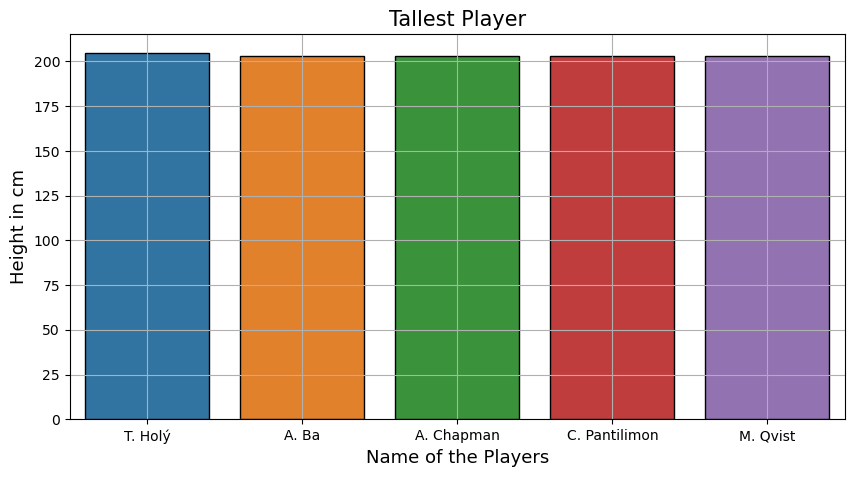

In [144]:
# Bar-plot of top 5 tallest players.
plt.figure(figsize=(10,5))
sns.barplot(x=list(player_height['short_name'][0:5]),y=list(player_height['height_cm'][0:5]),ec='black',lw=1)
plt.title("Tallest Player",fontsize=15)
plt.xlabel("Name of the Players",fontsize=13)
plt.ylabel("Height in cm",fontsize=13)
plt.grid(True)
plt.show()


### What is the range of the height of most of the players ?

In [145]:
# height_cm column of the dataset.
player_height['height_cm']

9208     205
8200     203
12808    203
3121     203
12864    203
        ... 
1496     158
4243     158
16929    158
3898     157
4829     156
Name: height_cm, Length: 18278, dtype: int64

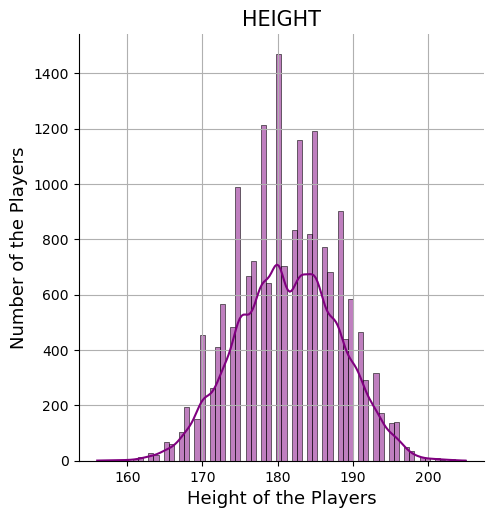

In [146]:
# Displot for the height_cm column of the dataset.
sns.displot(player_height["height_cm"],color="purple",kde=True)
plt.title("HEIGHT",fontsize=15)
plt.ylabel('Number of the Players',fontsize=13)
plt.xlabel('Height of the Players',fontsize=13)
plt.grid(True)
plt.show()

### Who is the heaviest player in the world ?

In [147]:
# Make a new dataset named player_weight of short_name and weight_kg columns.
player_weight=fifa[['short_name','weight_kg']]
player_weight

,short_name,weight_kg
0,L. Messi,72
1,Cristiano Ronaldo,83
2,Neymar Jr,68
3,J. Oblak,87
4,E. Hazard,74
...,...,...
18273,Shao Shuai,79
18274,Xiao Mingjie,66
18275,Zhang Wei,75
18276,Wang Haijian,74


In [148]:
# Head of the dataset.
player_weight.head()

,short_name,weight_kg
0,L. Messi,72
1,Cristiano Ronaldo,83
2,Neymar Jr,68
3,J. Oblak,87
4,E. Hazard,74


In [149]:
# Sort the dataset in the descending order of their weight.
player_weight=player_weight.sort_values(by='weight_kg',ascending=False)
player_weight

,short_name,weight_kg
10693,A. Akinfenwa,110
9572,C. Seitz,107
15064,E. Louro,104
7439,F. Farnolle,104
13576,L. Watkowiak,103
...,...,...
17078,J. García,53
10114,Isi Ros,53
4982,D. Rojas,52
17022,M. Abdullah,52


In [150]:
# Top 5 records of the dataset.
player_weight.head()

,short_name,weight_kg
10693,A. Akinfenwa,110
9572,C. Seitz,107
15064,E. Louro,104
7439,F. Farnolle,104
13576,L. Watkowiak,103


In [151]:
# Names of the top 5 heaviest players.
list(player_weight['short_name'][0:5])

['A. Akinfenwa', 'C. Seitz', 'E. Louro', 'F. Farnolle', 'L. Watkowiak']

In [152]:
# Weight of the top 5 heaviest players.
list(player_weight['weight_kg'][0:5])

[110, 107, 104, 104, 103]

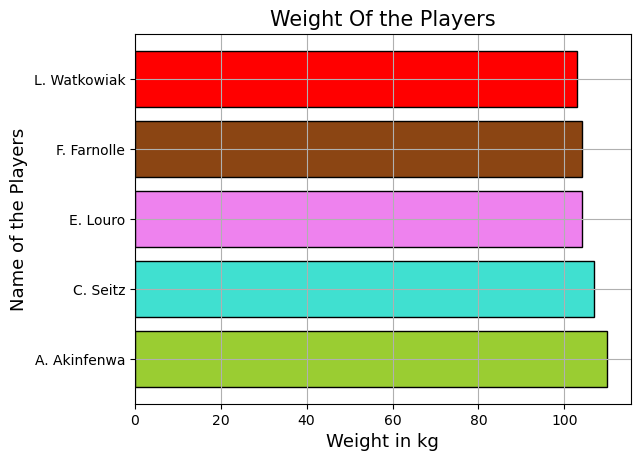

In [153]:
# Bar-plot for top 5 heaviest players.
mycolors = ["#9ACD32", "#40E0D0", "#EE82EE", "#8B4513",'#FF0000']
plt.barh(list(player_weight['short_name'][0:5]),list(player_weight['weight_kg'][0:5]),color=mycolors,ec='black',lw=1)
plt.title("Weight Of the Players",fontsize=15)
plt.xlabel('Weight in kg',fontsize=13)
plt.ylabel('Name of the Players',fontsize=13)
plt.grid(True)
plt.show()

### What is the range of the weight of most of the players ?

In [154]:
# weight_kg column of the dataset.
player_weight['weight_kg']

10693    110
9572     107
15064    104
7439     104
13576    103
        ... 
17078     53
10114     53
4982      52
17022     52
13070     50
Name: weight_kg, Length: 18278, dtype: int64

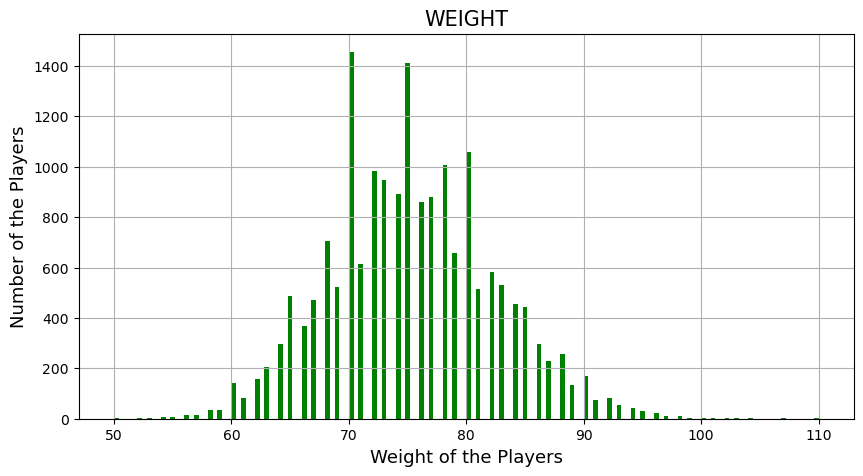

In [155]:
# Histogram for the weight_kg column of the dataset.
plt.figure(figsize=(10,5))
plt.hist(player_weight['weight_kg'],bins=150,color='green')
plt.title("WEIGHT",fontsize=15)
plt.ylabel('Number of the Players',fontsize=13)
plt.xlabel('Weight of the Players',fontsize=13)
plt.grid(True)
plt.show()

### Which Club has most number of the players ?

In [156]:
# Clubs names and the number of players in each of them.
fifa['club'].value_counts()

FC Barcelona                  33
Real Valladolid CF            33
VfL Wolfsburg                 33
Crystal Palace                33
Eintracht Frankfurt           33
                              ..
US Orléans Loiret Football     1
Canada                         1
Mexico                         1
Turkey                         1
Śląsk Wrocław                  1
Name: club, Length: 698, dtype: int64

In [157]:
# Top 5 clubs who have the maximum number of players.
fifa['club'].value_counts().index[0:5]

Index(['FC Barcelona', 'Real Valladolid CF', 'VfL Wolfsburg', 'Crystal Palace',
       'Eintracht Frankfurt'],
      dtype='object')

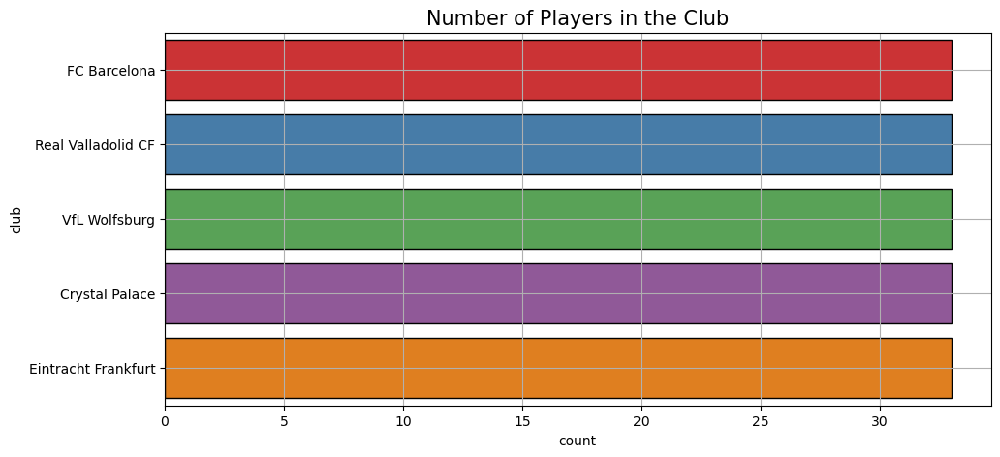

In [158]:
# Count-plot of top 5 club who have the maximum number of players.
plt.figure(figsize=(11,5))
sns.countplot(y='club',order=fifa['club'].value_counts().index[0:5],data=fifa,palette = "Set1",ec='black',lw=1)
plt.title('Number of Players in the Club',fontsize=15)
plt.grid(True)
plt.show()


### Which foot is most preferred by the players ?

In [159]:
# Name of the preferred foot and the number of players in each of them.
fifa['preferred_foot'].value_counts()

Right    13960
Left      4318
Name: preferred_foot, dtype: int64

In [160]:
# Name of the preferred foot and the number of players in each of them.
fifa['preferred_foot'].value_counts()[0:5]

Right    13960
Left      4318
Name: preferred_foot, dtype: int64

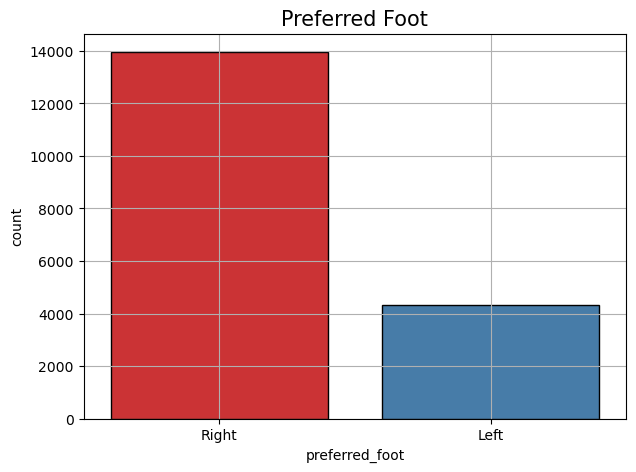

In [161]:
# Count-plot for preferred_foot of the players.
plt.figure(figsize=(7,5))
sns.countplot(x='preferred_foot',order=fifa['preferred_foot'].value_counts().index[0:5],data=fifa,palette ="Set1",ec='black',lw=1)
plt.title('Preferred Foot',fontsize=15)
plt.grid(True)
plt.show()

In [162]:
# Percentage of players preferred right foot.
13960*100/18278

76.37597111281322

### what range of international reputation does most of the players have ?

In [163]:
# Extract international_reputation columnn of the dataset.
fifa['international_reputation']

0        5
1        5
2        5
3        3
4        4
        ..
18273    1
18274    1
18275    1
18276    1
18277    1
Name: international_reputation, Length: 18278, dtype: int64

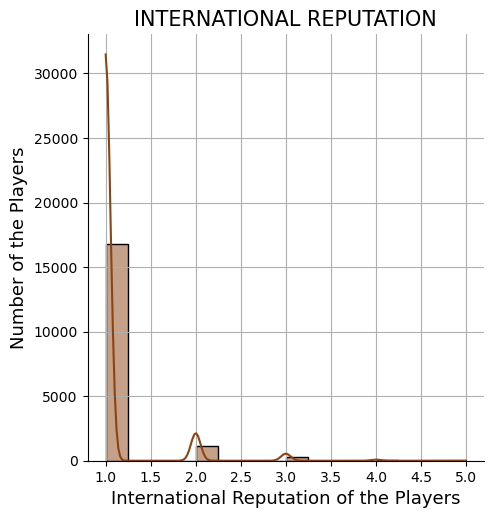

In [164]:
# Displot for the international_reputation column of the dataset.
sns.displot(fifa['international_reputation'],color="#8B4513",kde=True)
plt.title("INTERNATIONAL REPUTATION",fontsize=15)
plt.ylabel('Number of the Players',fontsize=13)
plt.xlabel('International Reputation of the Players',fontsize=13)
plt.grid(True)
plt.show()

### Who is the best dribbler in the world ?

In [165]:
# Create a dataFrame fifa_dribbling with short_name and dribbling columns.
fifa_dribbling=fifa[['short_name','dribbling']]
fifa_dribbling

,short_name,dribbling
0,L. Messi,96.0
1,Cristiano Ronaldo,89.0
2,Neymar Jr,95.0
3,J. Oblak,95.0
4,E. Hazard,94.0
...,...,...
18273,Shao Shuai,33.0
18274,Xiao Mingjie,35.0
18275,Zhang Wei,45.0
18276,Wang Haijian,47.0


In [166]:
# Sort the dataset in descending order of the dribbling.
fifa_dribbling_1=fifa_dribbling.sort_values(by='dribbling',ascending=False)
fifa_dribbling_1

,short_name,dribbling
0,L. Messi,96.0
2,Neymar Jr,95.0
3,J. Oblak,95.0
4,E. Hazard,94.0
41,Bernardo Silva,92.0
...,...,...
18155,M. Kouogun,28.0
13530,J. Julio,27.0
18142,L. Boore,27.0
18203,J. Branthwaite,26.0


In [167]:
# Top 5 records of the dataset.
fifa_dribbling_1[0:5]

,short_name,dribbling
0,L. Messi,96.0
2,Neymar Jr,95.0
3,J. Oblak,95.0
4,E. Hazard,94.0
41,Bernardo Silva,92.0


In [168]:
# Names of top 5 dribblers.
x=list(fifa_dribbling_1[0:5][0:5]['short_name'])
x

['L. Messi', 'Neymar Jr', 'J. Oblak', 'E. Hazard', 'Bernardo Silva']

In [169]:
# point of the top 5 dribblers.
y=list(fifa_dribbling_1[0:5][0:5]['dribbling'])
y

[96.0, 95.0, 95.0, 94.0, 92.0]

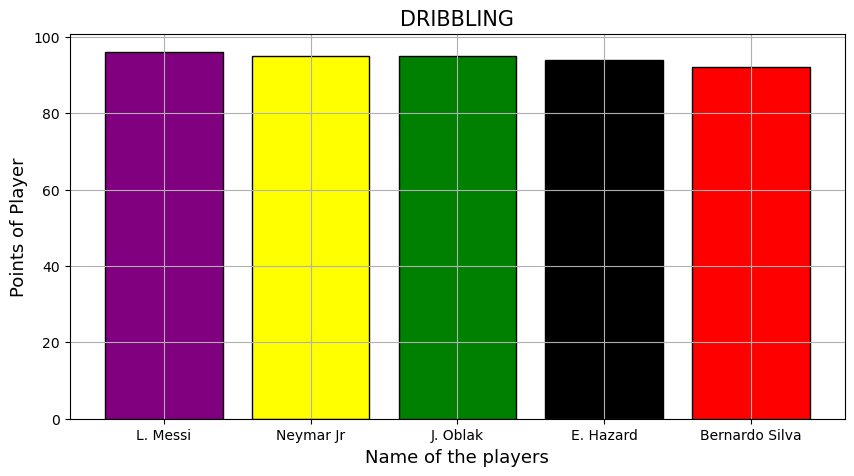

In [170]:
# Bar-plot of top 5 dribblers.
plt.figure(figsize=(10,5))
plt.bar(x,y,color=['purple','yellow','green','black','red'],ec='black',lw=1)
plt.grid(True)
plt.title("DRIBBLING",fontsize=15)
plt.xlabel('Name of the players',fontsize=13)
plt.ylabel('Points of Player',fontsize=13)
plt.show()

### Who is the best shooter in the world ?

In [171]:
# Create a dataFrame fifa_shooting with short_name and shooting columns.
fifa_shooting=fifa[['short_name','shooting']]
fifa_shooting

,short_name,shooting
0,L. Messi,92.0
1,Cristiano Ronaldo,93.0
2,Neymar Jr,85.0
3,J. Oblak,85.0
4,E. Hazard,83.0
...,...,...
18273,Shao Shuai,23.0
18274,Xiao Mingjie,24.0
18275,Zhang Wei,35.0
18276,Wang Haijian,35.0


In [172]:
# Sort the dataset in descending order of the shooting.
fifa_shooting_1=fifa_shooting.sort_values(by="shooting",ascending=False)
fifa_shooting_1

,short_name,shooting
1,Cristiano Ronaldo,93.0
0,L. Messi,92.0
12,H. Kane,91.0
14,De Gea,91.0
13,Alisson,91.0
...,...,...
16661,L. Polvani,16.0
12793,N. Canavan,16.0
3695,D. Maietta,16.0
11455,A. Camigliano,16.0


In [173]:
# Top 5 records of the dataset.
fifa_shooting_1[0:5]

,short_name,shooting
1,Cristiano Ronaldo,93.0
0,L. Messi,92.0
12,H. Kane,91.0
14,De Gea,91.0
13,Alisson,91.0


In [174]:
# Names of top 5 Shooters.
x=list(fifa_shooting_1[0:5][0:5]['short_name'])
x

['Cristiano Ronaldo', 'L. Messi', 'H. Kane', 'De Gea', 'Alisson']

In [175]:
# point of the top 5 shooters.
y=list(fifa_shooting_1[0:5][0:5]['shooting'])
y

[93.0, 92.0, 91.0, 91.0, 91.0]

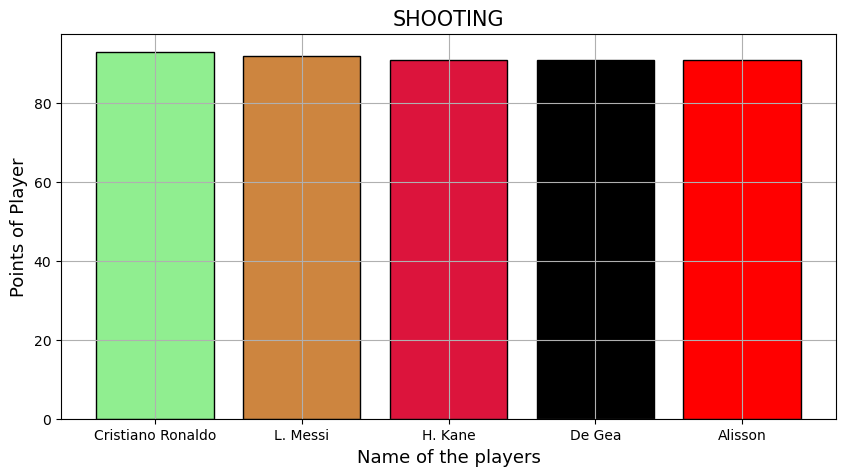

In [176]:
# Bar-plot of top 5 shooters.
plt.figure(figsize=(10,5))
plt.bar(x,y,color=['lightgreen','peru','crimson','black','red'],ec='black',lw=1)
plt.grid(True)
plt.title("SHOOTING",fontsize=15)
plt.xlabel('Name of the players',fontsize=13)
plt.ylabel('Points of Player',fontsize=13)
plt.show()

### Who is the best defender in the world ?

In [177]:
# Create a dataFrame fifa_defender with short_name and defending columns.
fifa_defending=fifa[['short_name','defending']]
fifa_defending

,short_name,defending
0,L. Messi,39.0
1,Cristiano Ronaldo,35.0
2,Neymar Jr,32.0
3,J. Oblak,32.0
4,E. Hazard,35.0
...,...,...
18273,Shao Shuai,47.0
18274,Xiao Mingjie,48.0
18275,Zhang Wei,48.0
18276,Wang Haijian,45.0


In [178]:
# Sort the dataset in descending order of the defending.
fifa_defending_1=fifa_defending.sort_values(by="defending",ascending=False)
fifa_defending_1

,short_name,defending
7,V. van Dijk,90.0
16,G. Chiellini,90.0
49,M. Hummels,89.0
35,D. Godín,89.0
11,K. Koulibaly,89.0
...,...,...
15767,L. Forte,16.0
18069,R. Boocock,16.0
17203,N. Jahn,15.0
17894,T. Murphy,15.0


In [179]:
# Top 5 records of the dataset.
fifa_defending_1[0:5]

,short_name,defending
7,V. van Dijk,90.0
16,G. Chiellini,90.0
49,M. Hummels,89.0
35,D. Godín,89.0
11,K. Koulibaly,89.0


In [180]:
# Names of top 5 defenders.
x=list(fifa_defending_1[0:5][0:5]['short_name'])
x

['V. van Dijk', 'G. Chiellini', 'M. Hummels', 'D. Godín', 'K. Koulibaly']

In [181]:
# point of the top 5 defender.
y=list(fifa_defending_1[0:5][0:5]['defending'])
y

[90.0, 90.0, 89.0, 89.0, 89.0]

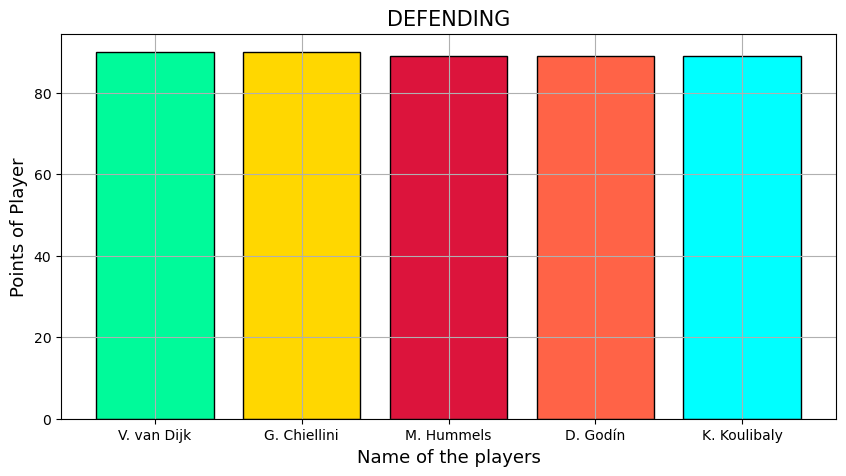

In [182]:
# Bar-plot of top 5 shooters.
plt.figure(figsize=(10,5))
plt.bar(x,y,color=['mediumspringgreen','gold','crimson','tomato','cyan'],ec='black',lw=1)
plt.grid(True)
plt.title("DEFENDING",fontsize=15)
plt.xlabel('Name of the players',fontsize=13)
plt.ylabel('Points of Player',fontsize=13)
plt.show()

### Which goalkeeper has the best reflexes in the world ?

In [183]:
# Create a dataFrame fifa_gk_reflexes with short_name and gk_reflexes columns.
fifa_gk_reflexes=fifa[['short_name','gk_reflexes']]
fifa_gk_reflexes

,short_name,gk_reflexes
0,L. Messi,68.017073
1,Cristiano Ronaldo,68.017073
2,Neymar Jr,68.017073
3,J. Oblak,89.000000
4,E. Hazard,89.000000
...,...,...
18273,Shao Shuai,45.000000
18274,Xiao Mingjie,45.000000
18275,Zhang Wei,45.000000
18276,Wang Haijian,45.000000


In [184]:
# Sort the dataset in descending order of the gk_reflexes.
fifa_gk_reflexes_1=fifa_gk_reflexes.sort_values(by="gk_reflexes",ascending=False)
fifa_gk_reflexes_1

,short_name,gk_reflexes
24,P. Pogba,92.0
15,N. Kanté,92.0
23,P. Dybala,92.0
22,A. Griezmann,92.0
21,Sergio Busquets,92.0
...,...,...
18272,P. Martin,45.0
18205,I. Bråholm,45.0
18203,J. Branthwaite,45.0
18202,D. Harrington,45.0


In [185]:
# Top 5 records of the dataset.
fifa_gk_reflexes_1[0:5]

,short_name,gk_reflexes
24,P. Pogba,92.0
15,N. Kanté,92.0
23,P. Dybala,92.0
22,A. Griezmann,92.0
21,Sergio Busquets,92.0


In [186]:
# Names of top 5 goalkeepers with best reflexes.
x=list(fifa_gk_reflexes_1[0:5][0:5]['short_name'])
x

['P. Pogba', 'N. Kanté', 'P. Dybala', 'A. Griezmann', 'Sergio Busquets']

In [187]:
# point of the top 5 goalkeepers with best reflexes .
y=list(fifa_gk_reflexes_1[0:5][0:5]['gk_reflexes'])
y

[92.0, 92.0, 92.0, 92.0, 92.0]

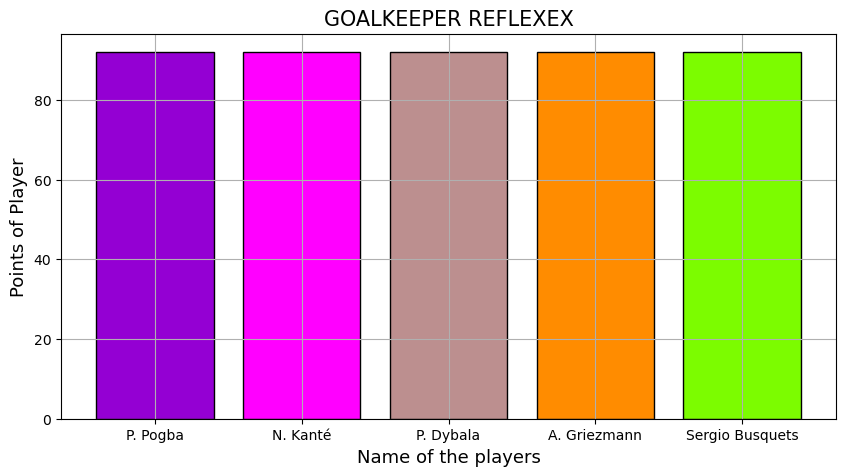

In [188]:
# Bar-plot of top 5 goalkeepers with best reflexes.
plt.figure(figsize=(10,5))
plt.bar(x,y,color=['darkviolet','magenta','rosybrown','darkorange','lawngreen'],ec='black',lw=1)
plt.grid(True)
plt.title("GOALKEEPER REFLEXEX",fontsize=15)
plt.xlabel('Name of the players',fontsize=13)
plt.ylabel('Points of Player',fontsize=13)
plt.show()

* England has the most number of players.
* L. Messi has the highest salary in the world.
* 97% of the players in the world have salary below than 50,000 eur.
* T. Holý is the tallest player in the world.
* Most of the players in the world have height between 175-185 cm.
* A. Akinfenwa is the heaviest player in the world.
* Most of the players in the world have weight between 70-80 kg.
* FC Barcelona is one of the club in the world who have the maximum number of players.
* 76% players preferred right foot as compared to left foot.
* Most of the players have 1 international reputation out of 5.
* L. Messi is the best dribbler in the world.
* Cristiano Ronaldo is the best shooter in the world.
* V. van Dijk is the best defender in the world.
* P. Pogba is the best reflexes in the world.

## Task 2:- Explore football skills and cluster football players based on their attributes.

### Load Libraries

In [189]:
#Load Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objs as go
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

#### Load Data

In [190]:
data = pd.read_csv("fifa_20.csv")
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [191]:
data.shape

(18278, 104)

In [192]:
list(data.columns)

['sofifa_id',
 'player_url',
 'short_name',
 'long_name',
 'age',
 'dob',
 'height_cm',
 'weight_kg',
 'nationality',
 'club',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'player_positions',
 'preferred_foot',
 'international_reputation',
 'weak_foot',
 'skill_moves',
 'work_rate',
 'body_type',
 'real_face',
 'release_clause_eur',
 'player_tags',
 'team_position',
 'team_jersey_number',
 'loaned_from',
 'joined',
 'contract_valid_until',
 'nation_position',
 'nation_jersey_number',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'player_traits',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_re

In [193]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


In [194]:
data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


### Exploratory Data Analysis

In [195]:
#Taking subsets of data for analysis
dataset1 = data[['short_name','age','height_cm','weight_kg','nationality','club','overall','potential','value_eur',
                 'wage_eur','player_positions','preferred_foot','international_reputation','weak_foot',
                 'skill_moves','work_rate','body_type','real_face','release_clause_eur','joined']]

In [196]:
numeric_features = ['age','height_cm','weight_kg','overall','potential','value_eur',
                 'wage_eur','international_reputation','weak_foot',
                 'skill_moves','release_clause_eur']
numeric_dataset1 = data[numeric_features]

In [197]:
dataset1.describe()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04
mean,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.723777e+06
std,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.079730e+07
min,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04
25%,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.740000e+05
50%,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,2.000000,1.300000e+06
75%,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,3.000000,3.800000e+06
max,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,5.000000,1.958000e+08


In [198]:
dataset1.isna().sum().sort_values(ascending=False)

short_name                  0
age                         0
release_clause_eur          0
real_face                   0
body_type                   0
work_rate                   0
skill_moves                 0
weak_foot                   0
international_reputation    0
preferred_foot              0
player_positions            0
wage_eur                    0
value_eur                   0
potential                   0
overall                     0
club                        0
nationality                 0
weight_kg                   0
height_cm                   0
joined                      0
dtype: int64

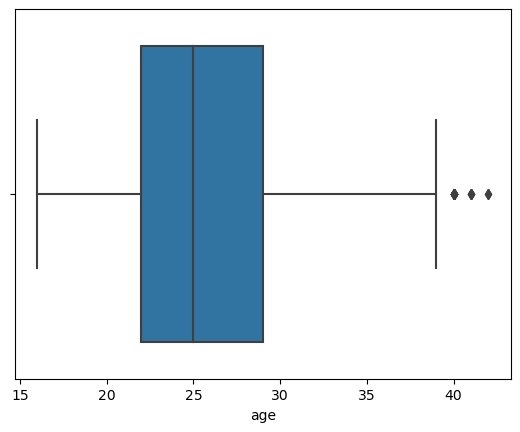

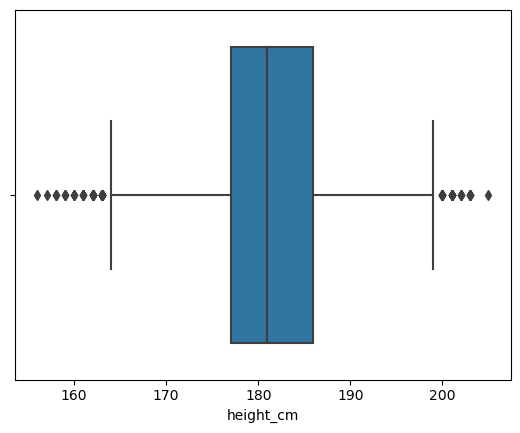

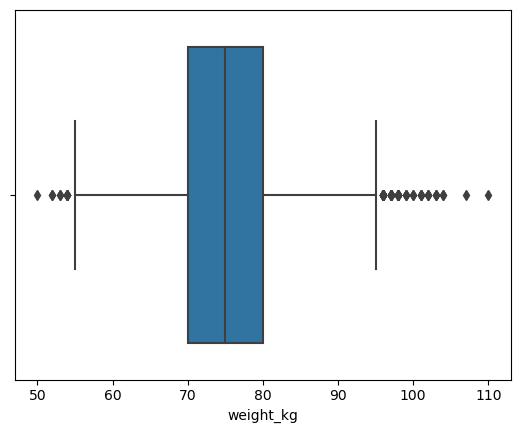

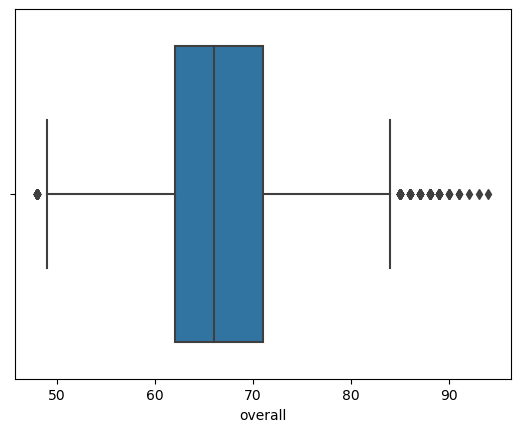

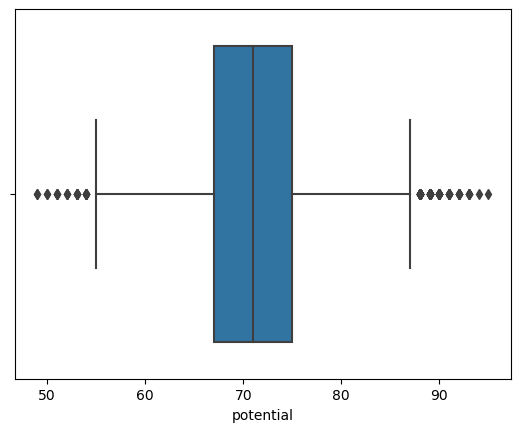

...

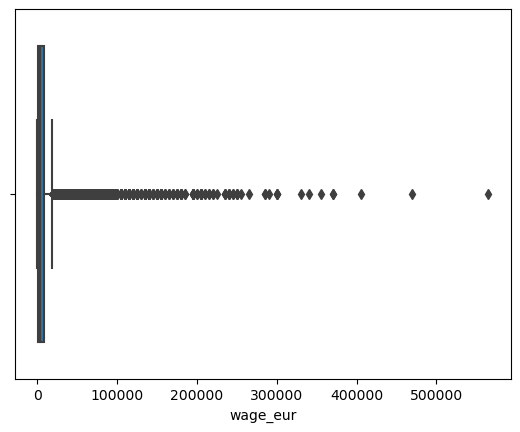

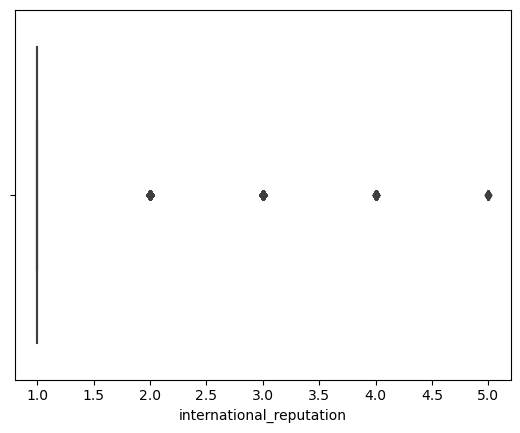

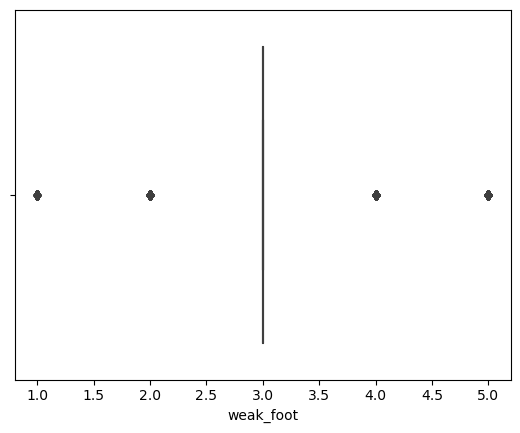

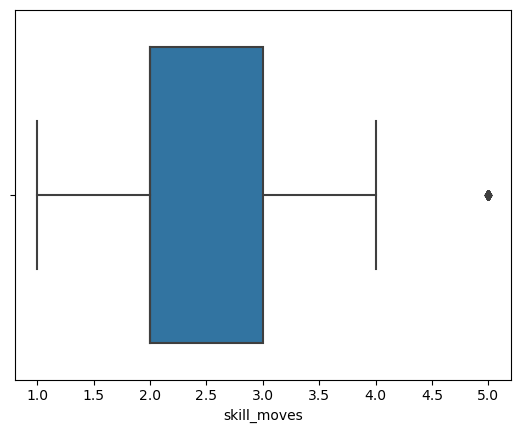

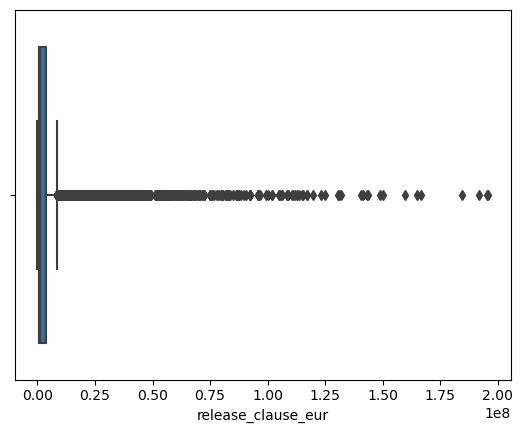

In [199]:
#boxplot for outliers
for col in numeric_dataset1.columns:
    sns.boxplot(x = col, data = dataset1) 
    plt.show()

array([[<Axes: title={'center': 'age'}>,
        <Axes: title={'center': 'height_cm'}>,
        <Axes: title={'center': 'weight_kg'}>],
       [<Axes: title={'center': 'overall'}>,
        <Axes: title={'center': 'potential'}>,
        <Axes: title={'center': 'value_eur'}>],
       [<Axes: title={'center': 'wage_eur'}>,
        <Axes: title={'center': 'international_reputation'}>,
        <Axes: title={'center': 'weak_foot'}>],
       [<Axes: title={'center': 'skill_moves'}>,
        <Axes: title={'center': 'release_clause_eur'}>, <Axes: >]],
      dtype=object)

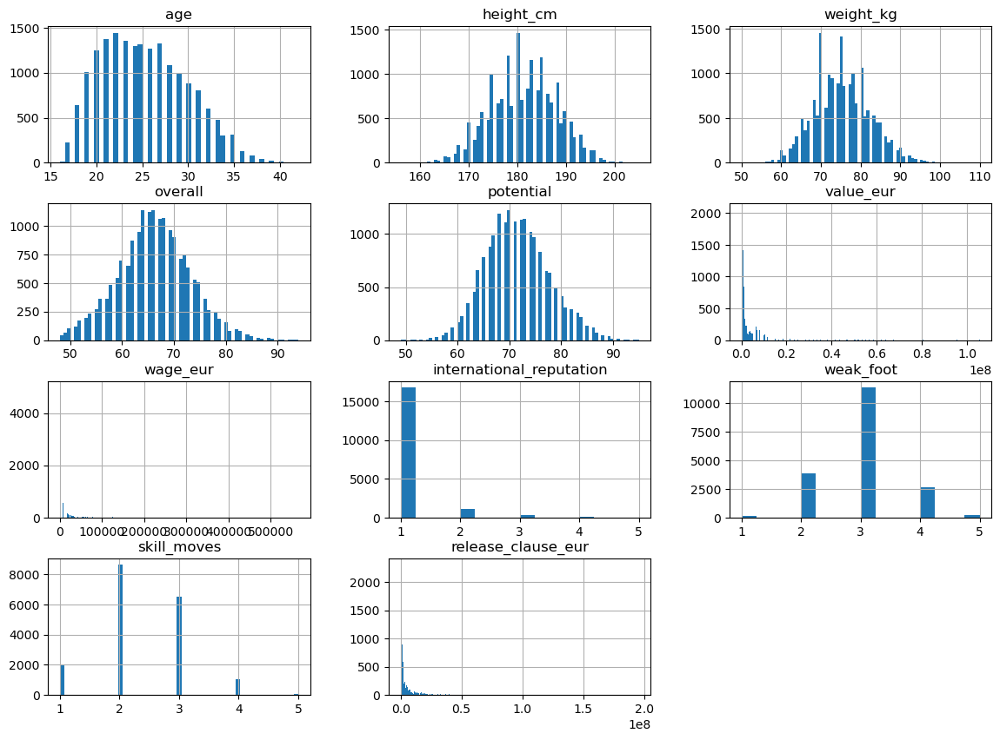

In [200]:
#histograms of numerical features
dataset1.hist(bins='auto', figsize=(14, 10))

### Exploring Features

#### Age

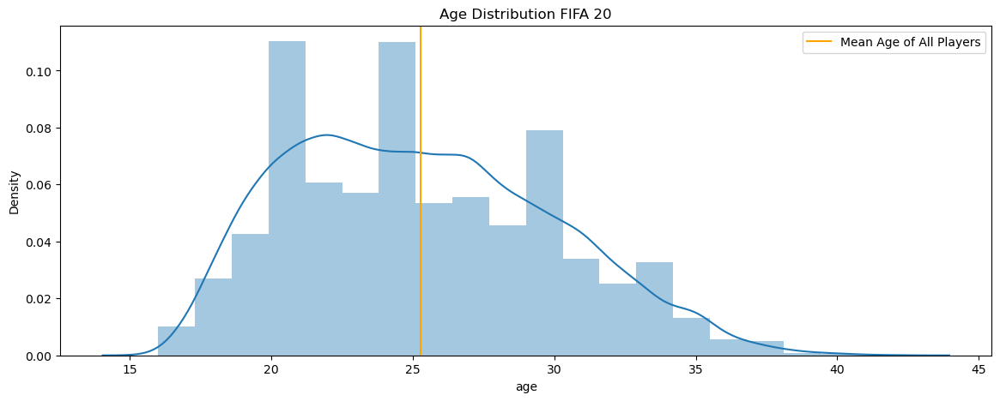

In [201]:
plt.figure(figsize=(14,5))
plt.title('Age Distribution FIFA 20')
sns.distplot(a=dataset1['age'], kde=True, bins=20)
plt.axvline(x=np.mean(dataset1['age']),c='orange',label='Mean Age of All Players')
plt.legend()

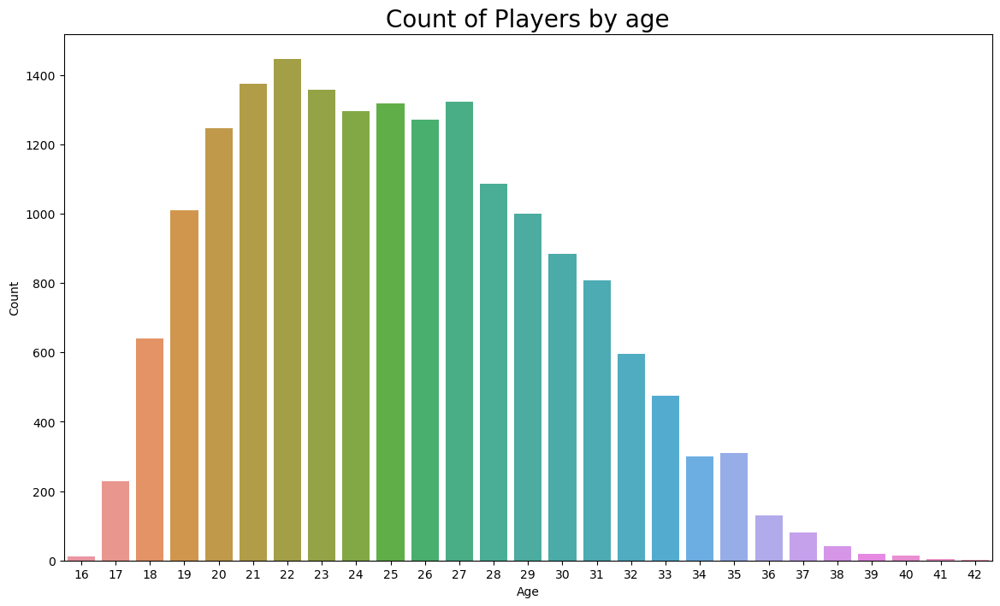

In [202]:
#Count of players of different ages
plt.figure(figsize= (14,8))

ax = sns.countplot(x='age', data=dataset1)
ax.set_title(label='Count of Players by age', fontsize=20)

ax.set_xlabel(xlabel='Age')
ax.set_ylabel(ylabel='Count')

plt.show()

In [203]:
#Oldest Player
print("Oldest Players: ")
data.loc[dataset1['age'] == data['age'].max()]

Oldest Players: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
11832,142998,https://sofifa.com/player/142998/cristian-muno...,C. Muñoz,Cristian Fernando Muñoz Hoffman,42,1977-07-01,177,73,Argentina,CD Universidad de Concepción,...,48+2,50+2,50+2,50+2,48+2,46+2,46+2,46+2,46+2,46+2
13003,208927,https://sofifa.com/player/208927/hussain-omar-...,H. Sulaimani,Hussein Omar Abdul Ghani Sulaimani,42,1977-01-21,173,70,Saudi Arabia,Al Ahli,...,62+2,66+2,66+2,66+2,62+2,62+2,66+2,66+2,66+2,62+2


In [204]:
#Youngest Player
print("Youngest Players: ")
data.loc[data['age'] == dataset1['age'].min()]

Youngest Players: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
4764,246618,https://sofifa.com/player/246618/adam-hlozek/2...,A. Hložek,Adam Hložek,16,2002-07-25,185,80,Czech Republic,Sparta Praha,...,52+2,50+2,50+2,50+2,52+2,49+2,46+2,46+2,46+2,49+2
6630,252037,https://sofifa.com/player/252037/fabio-daniel-...,Fábio Silva,Fábio Daniel Soares Silva,16,2002-07-19,185,75,Portugal,FC Porto,...,43+2,40+2,40+2,40+2,43+2,41+2,38+2,38+2,38+2,41+2
12158,252259,https://sofifa.com/player/252259/enzo-millot/2...,E. Millot,Enzo Millot,16,2002-07-17,175,65,France,AS Monaco,...,58+2,56+2,56+2,56+2,58+2,56+2,51+2,51+2,51+2,56+2
12160,247888,https://sofifa.com/player/247888/sebastiano-es...,S. Esposito,Sebastiano Esposito,16,2002-07-02,186,75,Italy,Inter,...,41+2,40+2,40+2,40+2,41+2,39+2,37+2,37+2,37+2,39+2
14626,252238,https://sofifa.com/player/252238/alan-velasco/...,A. Velasco,Alan Velasco,16,2002-07-27,167,63,Argentina,Independiente,...,55+2,54+2,54+2,54+2,55+2,55+2,50+2,50+2,50+2,55+2
17614,248187,https://sofifa.com/player/248187/daniel-obbekj...,D. Obbekjær,Daniel Obbekjær,16,2002-07-16,193,86,Denmark,Odense Boldklub,...,44+2,48+2,48+2,48+2,44+2,46+2,51+2,51+2,51+2,46+2
17782,248567,https://sofifa.com/player/248567/sebastian-and...,S. Anderson,Sebastian Anderson,16,2002-08-08,175,64,United States,Colorado Rapids,...,50+2,48+2,48+2,48+2,50+2,50+2,48+2,48+2,48+2,50+2
17827,251219,https://sofifa.com/player/251219/darragh-burns...,D. Burns,Darragh Burns,16,2002-08-06,176,62,Northern Ireland,St. Patrick's Athletic,...,43+2,39+2,39+2,39+2,43+2,42+2,36+2,36+2,36+2,42+2
18031,246815,https://sofifa.com/player/246815/oliver-stefan...,O. Stefánsson,Oliver Stefánsson,16,2002-08-03,190,75,Iceland,IFK Norrköping,...,43+2,45+2,45+2,45+2,43+2,46+2,50+2,50+2,50+2,46+2
18171,252892,https://sofifa.com/player/252892/joseph-starbu...,J. Starbuck,Joseph Starbuck,16,2002-08-03,174,69,England,Grimsby Town,...,44+2,43+2,43+2,43+2,44+2,43+2,40+2,40+2,40+2,43+2


In [205]:
#Skewness
dataset1['age'].skew()

0.38061976075931975

##### Impact of Age on Overall rating

In [206]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = dataset1['age'],
    y = dataset1['overall'],
    mode='markers',
    marker=dict(
        color=dataset1['overall'], 
        showscale=True
    ),
    text= dataset1['short_name'],
))

fig.update_layout(title='Age vs Overall Rating',
                  xaxis_title='Age',
                  yaxis_title='Overall Rating')
fig.show()

#### Height

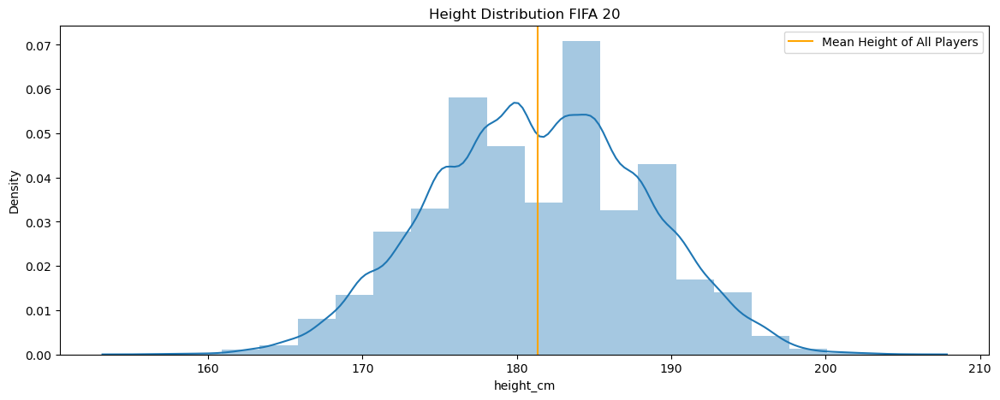

In [207]:
plt.figure(figsize=(14,5))
plt.title('Height Distribution FIFA 20')
sns.distplot(a=dataset1['height_cm'], kde=True, bins=20)
plt.axvline(x=np.mean(dataset1['height_cm']),c='orange',label='Mean Height of All Players')
plt.legend()

In [208]:
#Tallest Player
print("Tallest Players: ")
data.loc[data['height_cm'] == dataset1['height_cm'].max()]

Tallest Players: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
9208,199321,https://sofifa.com/player/199321/tomas-holy/20...,T. Holý,Tomáš Holý,27,1991-12-10,205,102,Czech Republic,Ipswich Town,...,46+2,46+2,46+2,46+2,46+2,42+2,37+2,37+2,37+2,42+2


In [209]:
#Shortest Player
print("Shortest Player: ")
data.loc[data['height_cm'] == dataset1['height_cm'].min()]

Shortest Player: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
4829,237994,https://sofifa.com/player/237994/nahuel-barrio...,N. Barrios,Cristian Nahuel Barrios,21,1998-05-07,156,58,Argentina,San Lorenzo de Almagro,...,56+2,52+2,52+2,52+2,56+2,54+2,44+2,44+2,44+2,54+2


In [210]:
#Skewness
dataset1['height_cm'].skew()

-0.03819688576323108

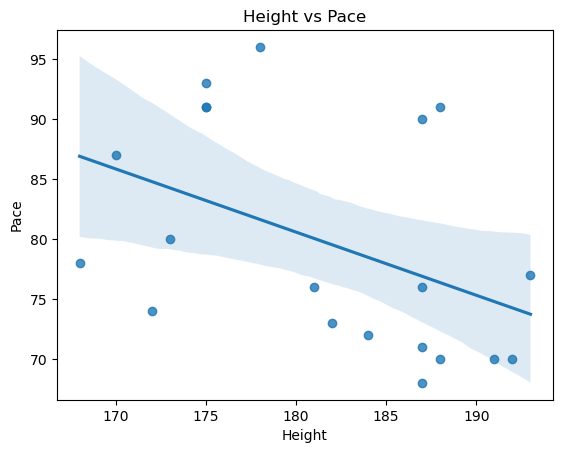

In [211]:
plt.figure()
x=data.head(20)['height_cm']
y=data.head(20)['pace']

sns.regplot(x=x,y=y)
plt.title('Height vs Pace')
plt.xlabel('Height')
plt.ylabel('Pace')
plt.show()

#### Weight

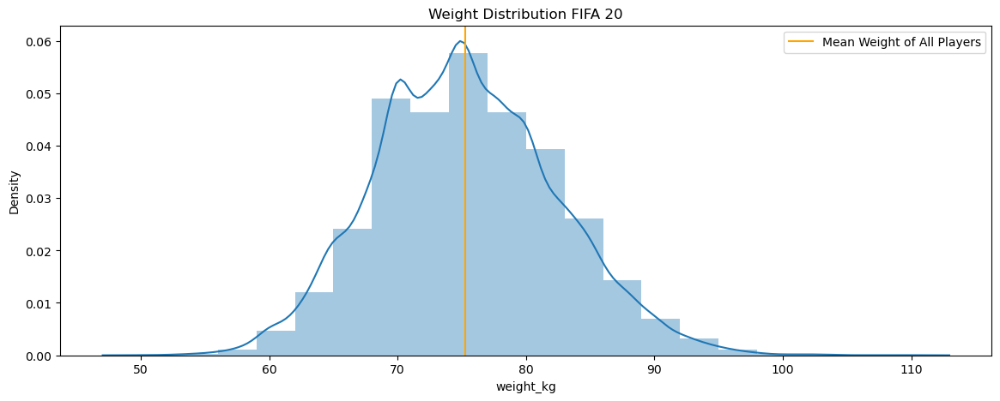

In [212]:
plt.figure(figsize=(14,5))
plt.title('Weight Distribution FIFA 20')
sns.distplot(a=dataset1['weight_kg'], kde=True, bins=20)
plt.axvline(x=np.mean(dataset1['weight_kg']),c='orange',label='Mean Weight of All Players')
plt.legend()

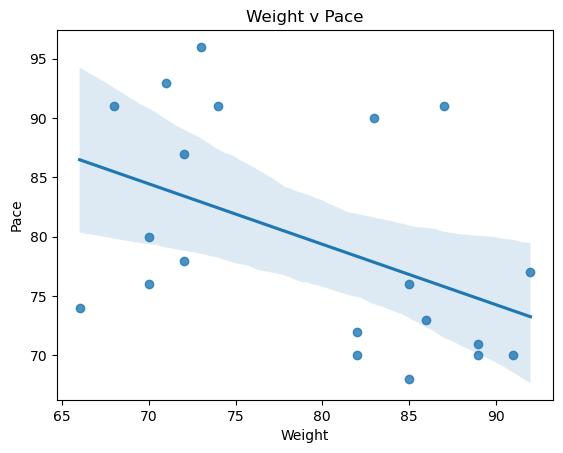

In [213]:
plt.figure()
x=data.head(20)['weight_kg']
y=data.head(20)['pace']

sns.regplot(x=x,y=y)
plt.title('Weight v Pace')
plt.xlabel('Weight')
plt.ylabel('Pace')
plt.show()

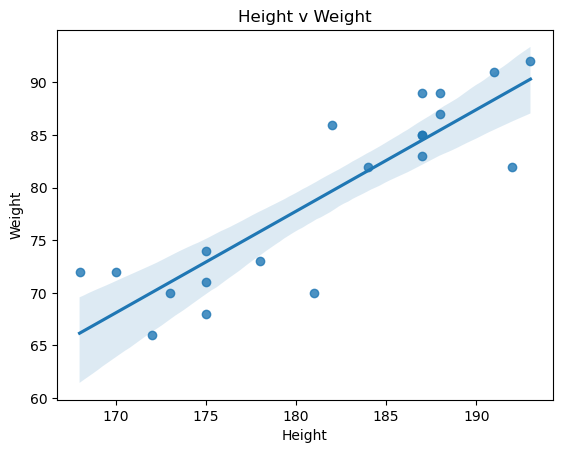

In [214]:
plt.figure()
x=data.head(20)['height_cm']
y=data.head(20)['weight_kg']

sns.regplot(x=x,y=y)
plt.title('Height v Weight')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.show()

#### BMI

In [215]:
data['bmi'] = data['weight_kg'] // (data['height_cm']/100)**2

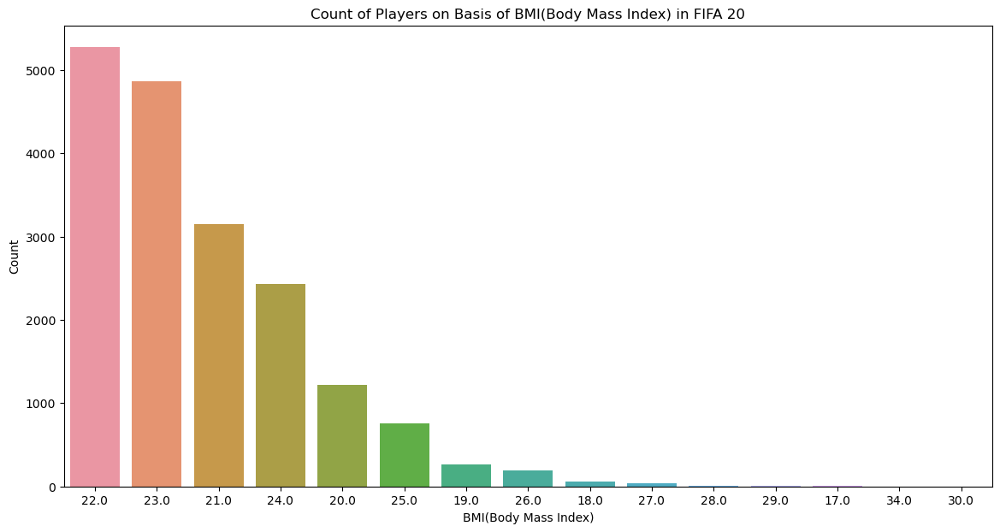

In [216]:
plt.figure(figsize= (14, 7))

ax = sns.countplot(x='bmi', data=data, order=data.bmi.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of BMI(Body Mass Index) in FIFA 20')

ax.set_xlabel(xlabel='BMI(Body Mass Index)')
ax.set_ylabel(ylabel='Count')

plt.show()

In [217]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = data['bmi'],
    y = dataset1['overall'],
    mode='markers',
    marker=dict(
        color=dataset1['overall'], 
        showscale=True
    ),
    text= dataset1['short_name'],
))

fig.update_layout(title='BMI vs Overall Rating',
                  xaxis_title='BMI',
                  yaxis_title='Overall Rating')
fig.show()

#### Nationality

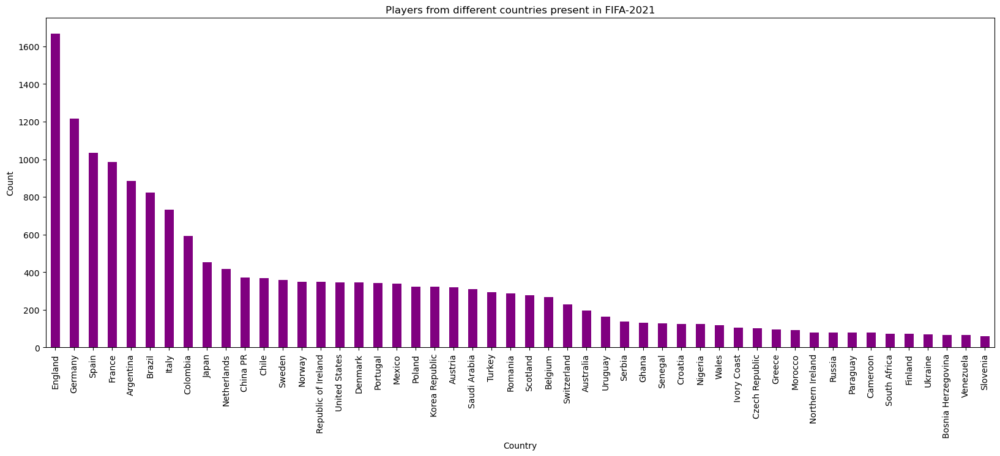

In [218]:
plt.figure(figsize = (20,7))
dataset1['nationality'].value_counts().head(50).plot.bar(color = 'purple')
plt.title('Players from different countries present in FIFA-2021')
plt.xlabel('Country')
plt.ylabel('Count')
plt.show()

##### Nationality vs Overall Rating

In [219]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = dataset1['nationality'],
    y = dataset1['overall'],
    mode='markers',
    marker=dict(
        color=dataset1['overall'], 
        showscale=True
    ),
    text= dataset1['short_name'],
))

fig.update_layout(title='Nationality vs Overall Rating',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating')
fig.show()

#### Overall

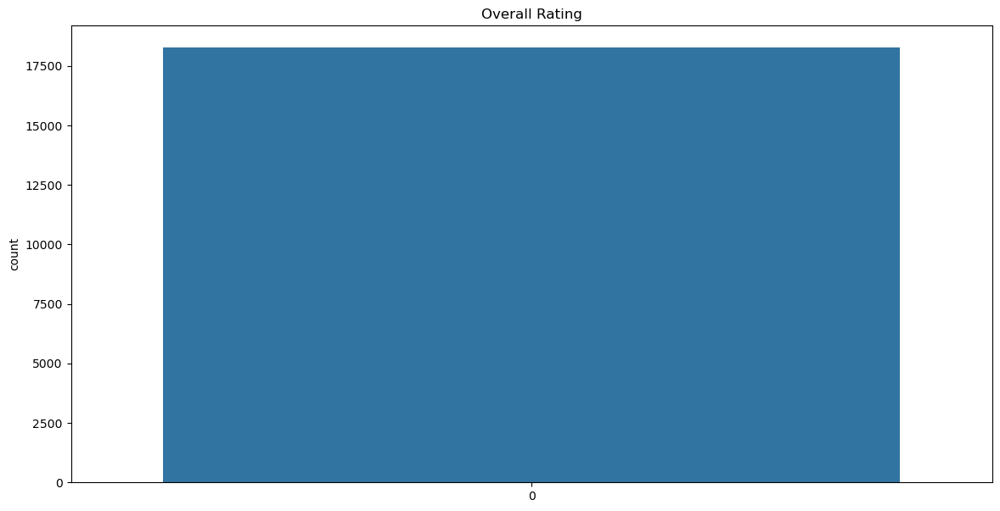

In [220]:
plt.figure(figsize=(14, 7))
sns.countplot(dataset1['overall'])
plt.title("Overall Rating")
plt.show()

In [221]:
print("Min: ", dataset1['overall'].min())
print("Mean: ", dataset1['overall'].mean())
print("Max: ", dataset1['overall'].max())

Min:  48
Mean:  66.24499398183609
Max:  94


In [222]:
#Player with highest rating
data.loc[data['overall'] == dataset1['overall'].max()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0


#### Top Rated Players

In [223]:
#Top 10 Players
top_rated = data.sort_values(by=["overall"], ascending=False)
top_rated.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23.0
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.0
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,24.0
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.0
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21.0
6,192448,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,27,1992-04-30,187,85,Germany,FC Barcelona,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,24.0
7,203376,https://sofifa.com/player/203376/virgil-van-di...,V. van Dijk,Virgil van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,...,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3,24.0
8,177003,https://sofifa.com/player/177003/luka-modric/2...,L. Modrić,Luka Modrić,33,1985-09-09,172,66,Croatia,Real Madrid,...,81+3,81+3,81+3,81+3,79+3,72+3,72+3,72+3,79+3,22.0
9,209331,https://sofifa.com/player/209331/mohamed-salah...,M. Salah,Mohamed Salah Ghaly,27,1992-06-15,175,71,Egypt,Liverpool,...,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23.0


In [224]:
fig = px.pie(top_rated.head(25), names='club',
             title='Percentage of Clubs in top 25 players')
fig.show()

In [225]:
fig = px.pie(top_rated.head(25), names='nationality',
             title='Percentage of Nations in top 25 players')
fig.show()

#### Potential

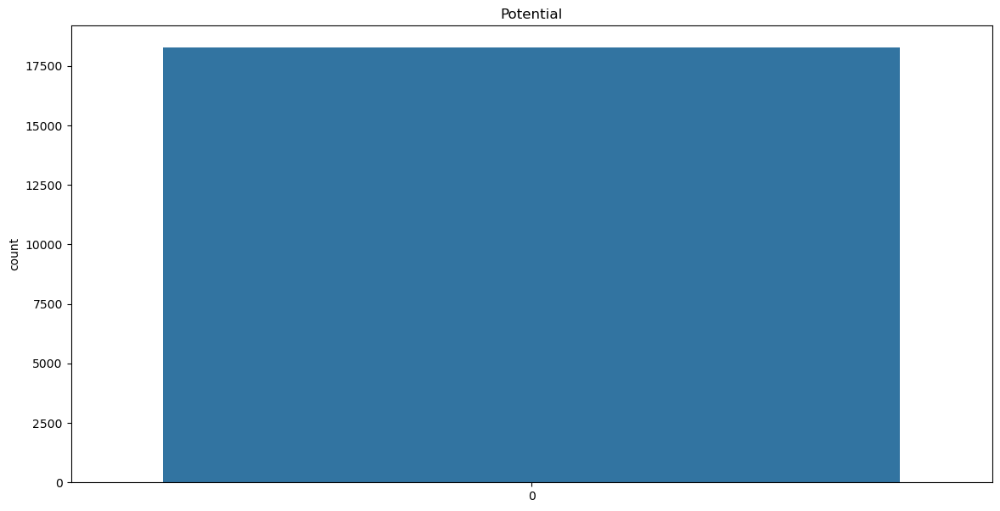

In [226]:
plt.figure(figsize=(14, 7))
sns.countplot(dataset1['potential'])
plt.title("Potential")
plt.show()

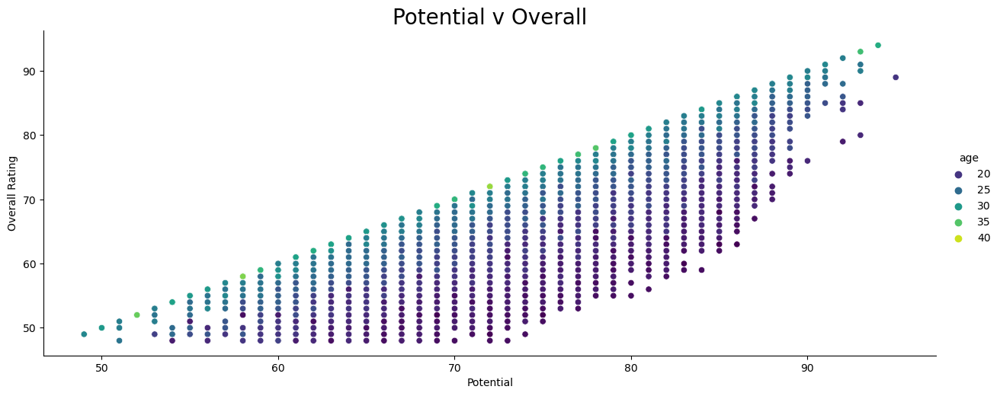

In [227]:
sns.relplot(x='potential',y='overall',hue='age',palette = 'viridis', aspect=2.5,data=data)
plt.title('Potential v Overall',fontsize = 20)
plt.xlabel('Potential')
plt.ylabel('Overall Rating')
plt.show()

#### Value

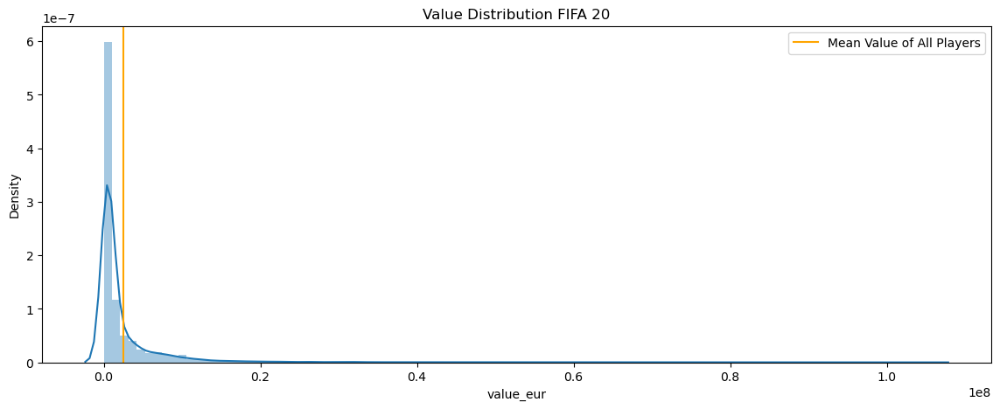

In [228]:
plt.figure(figsize=(14,5))
plt.title('Value Distribution FIFA 20')
sns.distplot(a=dataset1['value_eur'], kde=True, bins=100)
plt.axvline(x=np.mean(dataset1['value_eur']),c='orange',label='Mean Value of All Players')
plt.legend()

In [229]:
#Skewness
dataset1['value_eur'].skew()

6.425940918096741

Text(0.5, 1.0, 'Value of top 10 players')

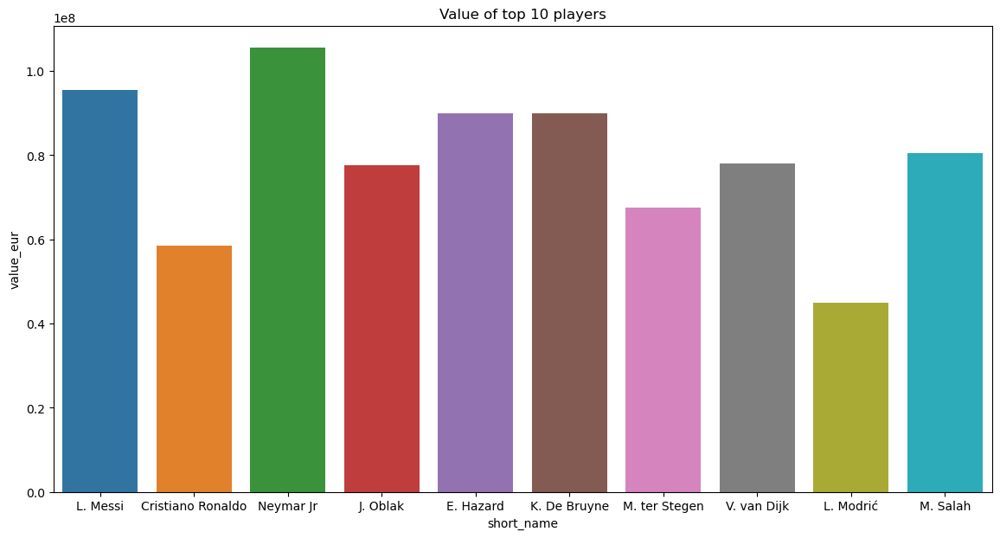

In [230]:
#Value of Top 10 players
plt.figure(figsize=(14, 7))
sns.barplot(x=top_rated['short_name'].head(10),y=top_rated['value_eur'].head(10)).set_title("Value of top 10 players")

In [231]:
#Most Valueable
data.loc[data['value_eur'] == dataset1['value_eur'].max()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.0


In [232]:
#Most Valued Players
top_valued = data.sort_values(by=["value_eur"], ascending=False)
top_valued.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.0
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,...,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23.0
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21.0
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.0
12,202126,https://sofifa.com/player/202126/harry-kane/20...,H. Kane,Harry Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,...,66+3,66+3,66+3,65+3,62+3,60+3,60+3,60+3,62+3,25.0
9,209331,https://sofifa.com/player/209331/mohamed-salah...,M. Salah,Mohamed Salah Ghaly,27,1992-06-15,175,71,Egypt,Liverpool,...,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23.0
7,203376,https://sofifa.com/player/203376/virgil-van-di...,V. van Dijk,Virgil van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,...,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3,24.0
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,24.0
23,211110,https://sofifa.com/player/211110/paulo-dybala/...,P. Dybala,Paulo Bruno Exequiel Dybala,25,1993-11-15,177,75,Argentina,Juventus,...,64+3,64+3,64+3,68+3,64+3,54+3,54+3,54+3,64+3,23.0


In [233]:
fig = px.pie(top_valued.head(25), names='club',
             title='Percentage of Clubs in top 25 players')
fig.show()

In [234]:
fig = px.pie(top_valued.head(25), names='nationality',
             title='Percentage of Nations in top 25 players')
fig.show()

Text(0.5, 1.0, 'Top 10 Valued players')

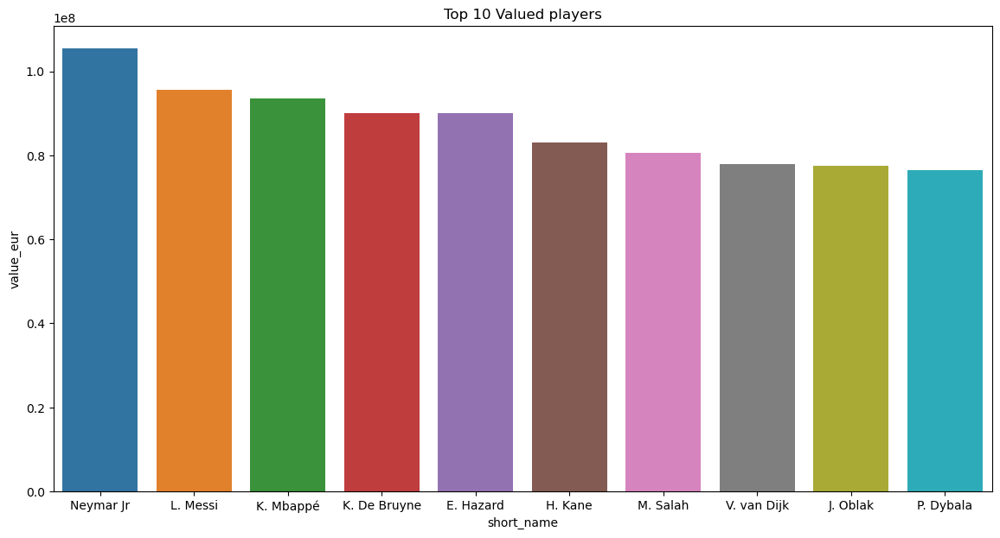

In [235]:
#Top 10 Valued players
plt.figure(figsize=(14, 7))
sns.barplot(x=top_valued['short_name'].head(10),y=top_valued['value_eur'].head(10)).set_title("Top 10 Valued players")

#### Prefered Foot

<Axes: xlabel='preferred_foot', ylabel='count'>

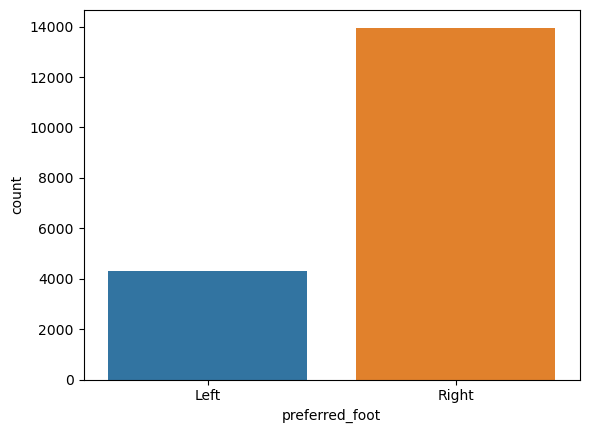

In [236]:
sns.countplot(x = dataset1['preferred_foot'])

In [237]:
foot = ['Left', 'Right']
foot_data = data.query('preferred_foot in @foot')    
fig = px.pie(foot_data, names='preferred_foot',
             title='Preferred foot %')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [238]:
print("The average overall score of preferred Right foot", dataset1.loc[dataset1['preferred_foot'] == 'Right']['overall'].mean())
print("The average overall score of preferred Left foot", dataset1.loc[dataset1['preferred_foot'] == 'Left']['overall'].mean())

The average overall score of preferred Right foot 66.11174785100286
The average overall score of preferred Left foot 66.67577582213988


#### International Reputation

<Axes: xlabel='international_reputation', ylabel='count'>

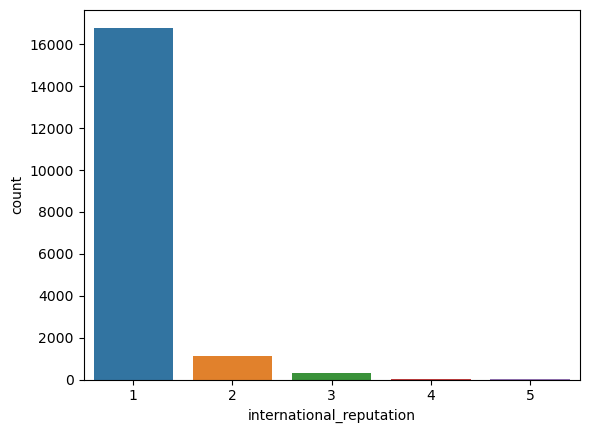

In [239]:
sns.countplot(x = dataset1['international_reputation'])

#### Skill Moves

<Axes: xlabel='skill_moves', ylabel='count'>

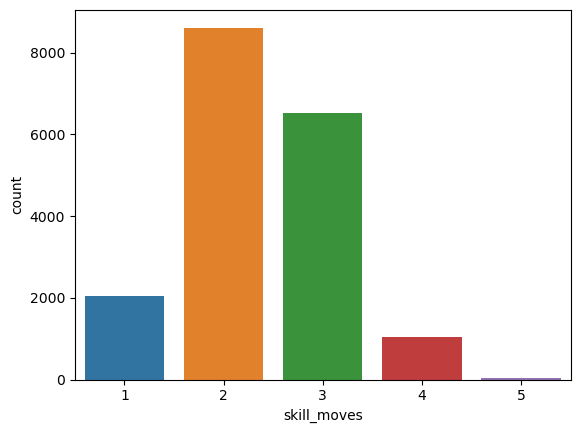

In [240]:
sns.countplot(x = dataset1['skill_moves'])

#### Work Rate

<Axes: xlabel='work_rate', ylabel='count'>

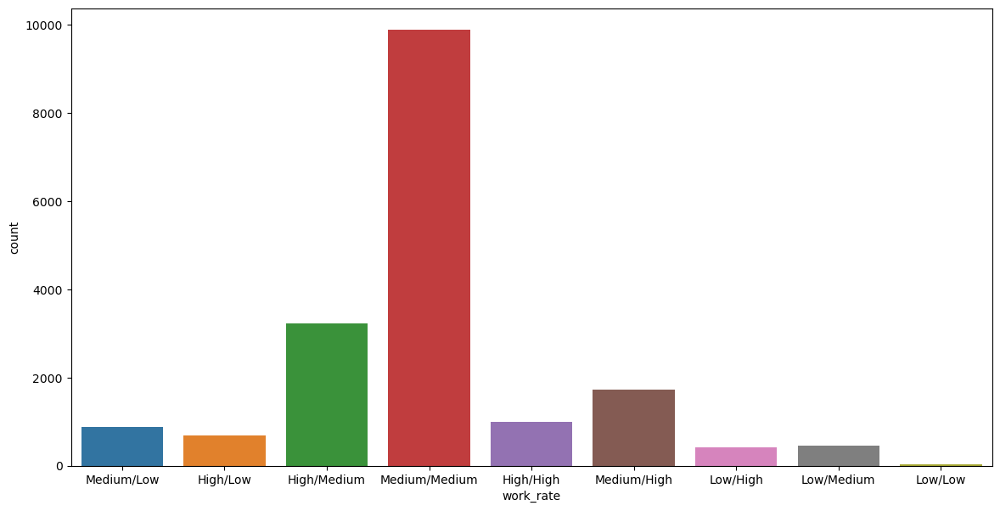

In [241]:
plt.figure(figsize=(14,7))
sns.countplot(x = dataset1['work_rate'])

#### Team Position

<Axes: xlabel='team_position', ylabel='count'>

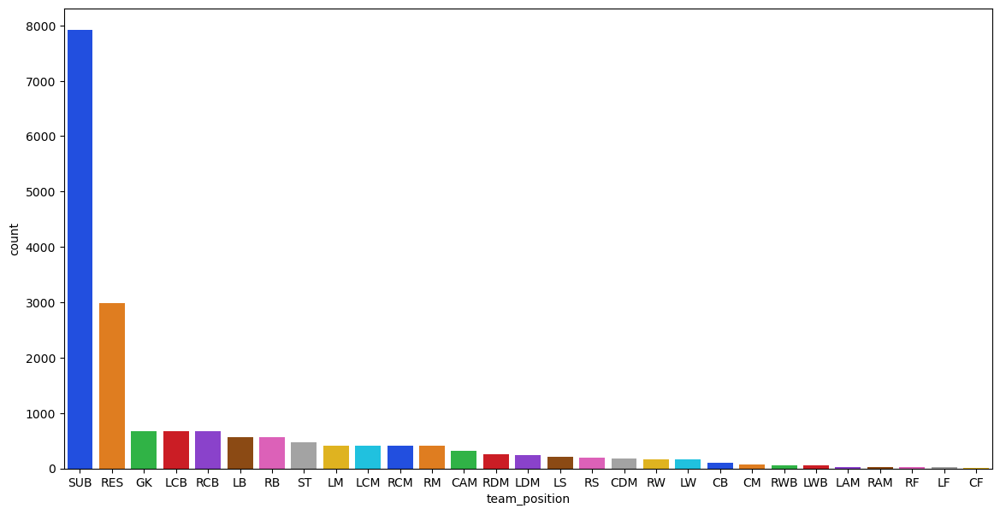

In [242]:
plt.figure(figsize=(14, 7))
sns.countplot(x='team_position', data=data, palette='bright', order=data.team_position.value_counts().index)

In [243]:
attack = ['LW', 'RW', 'ST', 'LF', 'RF', 'CF', 'LS', 'RS']
attack_data = data.query('team_position in @attack')    
fig = px.pie(attack_data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Inferno ,
             title='Percentages of Player Attacking Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [244]:
defence = ['LWB', 'RWB', 'CB', 'LB', 'RB', 'LCB', 'RCB']
defence_data = data.query('team_position in @defence')    
fig = px.pie(defence_data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Inferno ,
             title='Percentages of Player Defending Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [245]:
mid = ['CM', 'RCM', 'LCM', 'RM', 'LM', 'CAM', 'RDM', 'LDM', 'CDM', 'RAM', 'LAM']
mid_data = data.query('team_position in @mid')    
fig = px.pie(mid_data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Inferno ,
             title='Percentages of Player Midfield Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

#### Release Clause

In [246]:
high_release = data.sort_values(by=['release_clause_eur'], ascending=False)
high_release.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.0
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,...,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23.0
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.0
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21.0
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,24.0
12,202126,https://sofifa.com/player/202126/harry-kane/20...,H. Kane,Harry Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,...,66+3,66+3,66+3,65+3,62+3,60+3,60+3,60+3,62+3,25.0
7,203376,https://sofifa.com/player/203376/virgil-van-di...,V. van Dijk,Virgil van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,...,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3,24.0
9,209331,https://sofifa.com/player/209331/mohamed-salah...,M. Salah,Mohamed Salah Ghaly,27,1992-06-15,175,71,Egypt,Liverpool,...,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23.0
6,192448,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,27,1992-04-30,187,85,Germany,FC Barcelona,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,24.0


Text(0.5, 1.0, 'Top Release clauses')

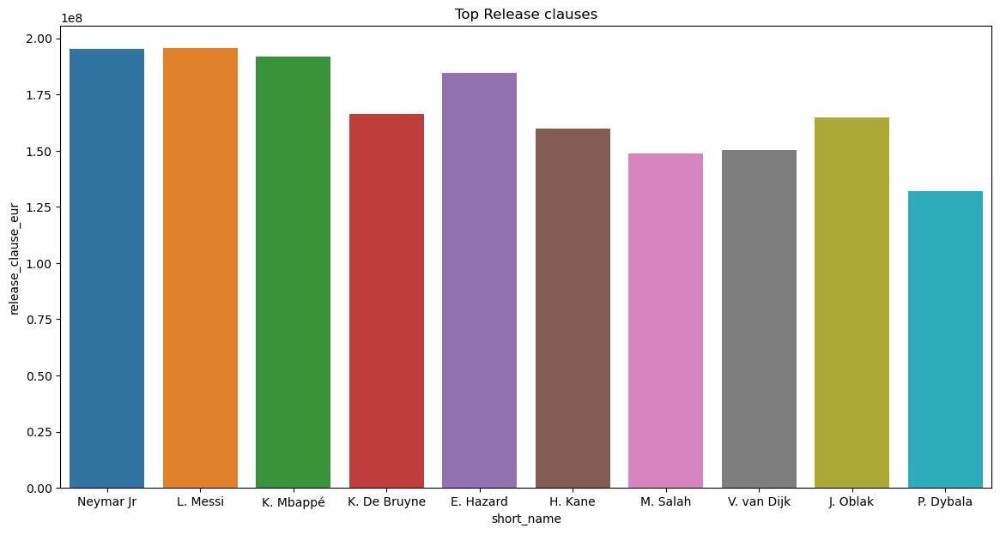

In [247]:
#Top Release clauses 
plt.figure(figsize=(14, 7))
sns.barplot(x=top_valued['short_name'].head(10),y=top_valued['release_clause_eur'].head(10)).set_title("Top Release clauses")

In [248]:
print("Min: ", dataset1['release_clause_eur'].min())
print("Mean: ", dataset1['release_clause_eur'].mean())
print("Max: ", dataset1['release_clause_eur'].max())

Min:  13000.0
Mean:  4723776.999671737
Max:  195800000.0


#### Wages

In [249]:
high_wage = data.sort_values(by=['wage_eur'], ascending=False)
high_wage.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.0
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23.0
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21.0
22,194765,https://sofifa.com/player/194765/antoine-griez...,A. Griezmann,Antoine Griezmann,28,1991-03-21,176,73,France,FC Barcelona,...,71+3,71+3,71+3,73+3,70+3,65+3,65+3,65+3,70+3,23.0
19,176580,https://sofifa.com/player/176580/luis-suarez/2...,L. Suárez,Luis Alberto Suárez Díaz,32,1987-01-24,182,86,Uruguay,FC Barcelona,...,67+5,67+5,67+5,67+5,64+5,63+5,63+5,63+5,64+5,25.0
8,177003,https://sofifa.com/player/177003/luka-modric/2...,L. Modrić,Luka Modrić,33,1985-09-09,172,66,Croatia,Real Madrid,...,81+3,81+3,81+3,81+3,79+3,72+3,72+3,72+3,79+3,22.0
36,182521,https://sofifa.com/player/182521/toni-kroos/20...,T. Kroos,Toni Kroos,29,1990-01-04,183,76,Germany,Real Madrid,...,79+3,79+3,79+3,75+3,72+3,69+3,69+3,69+3,72+3,22.0
17,153079,https://sofifa.com/player/153079/sergio-aguero...,S. Agüero,Sergio Leonel Agüero del Castillo,31,1988-06-02,173,70,Argentina,Manchester City,...,58+3,58+3,58+3,60+3,56+3,50+3,50+3,50+3,56+3,23.0
21,189511,https://sofifa.com/player/189511/sergio-busque...,Sergio Busquets,Sergio Busquets i Burgos,30,1988-07-16,189,76,Spain,FC Barcelona,...,86+3,86+3,86+3,78+3,78+3,82+3,82+3,82+3,78+3,21.0


Text(0.5, 1.0, 'Highest Wages')

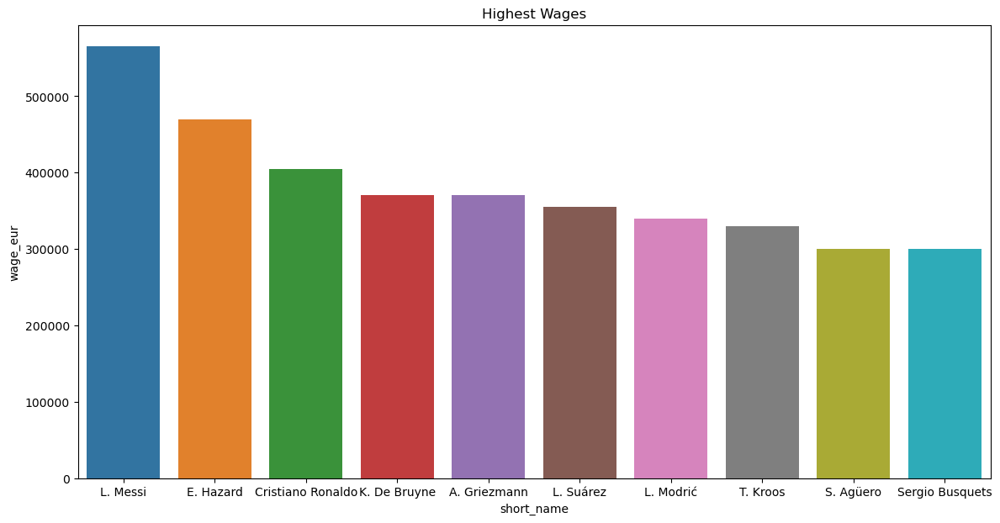

In [250]:
#Highest Wages
plt.figure(figsize=(14, 7))
sns.barplot(x=high_wage['short_name'].head(10),y=high_wage['wage_eur'].head(10)).set_title("Highest Wages")

In [251]:
print("Min: ", dataset1['release_clause_eur'].min())
print("Mean: ", dataset1['release_clause_eur'].mean())
print("Max: ", dataset1['release_clause_eur'].max())

Min:  13000.0
Mean:  4723776.999671737
Max:  195800000.0


Text(0.5, 1.0, 'Wage of top 10 players')

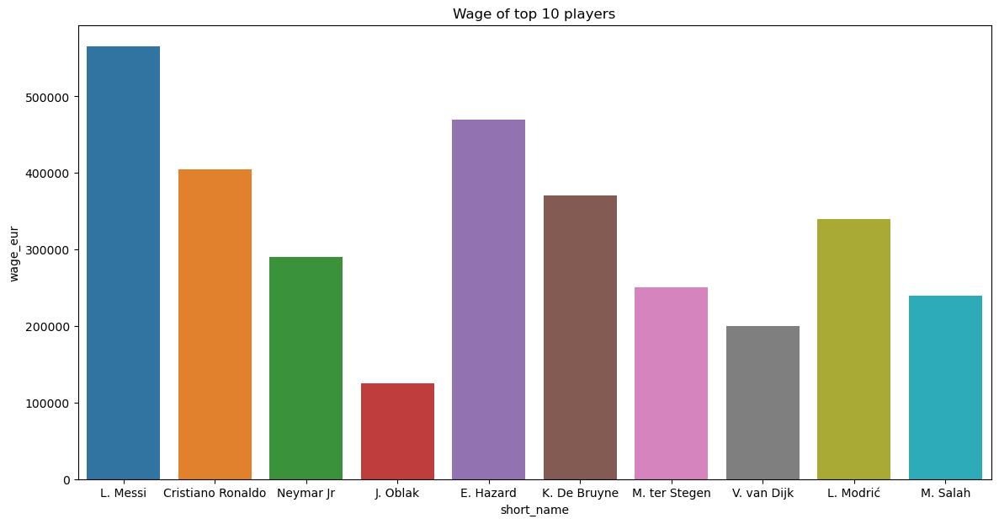

In [252]:
#Wage of top 10 rated
plt.figure(figsize=(14, 7))
sns.barplot(x=top_rated['short_name'].head(10),y=top_rated['wage_eur'].head(10)).set_title("Wage of top 10 players")

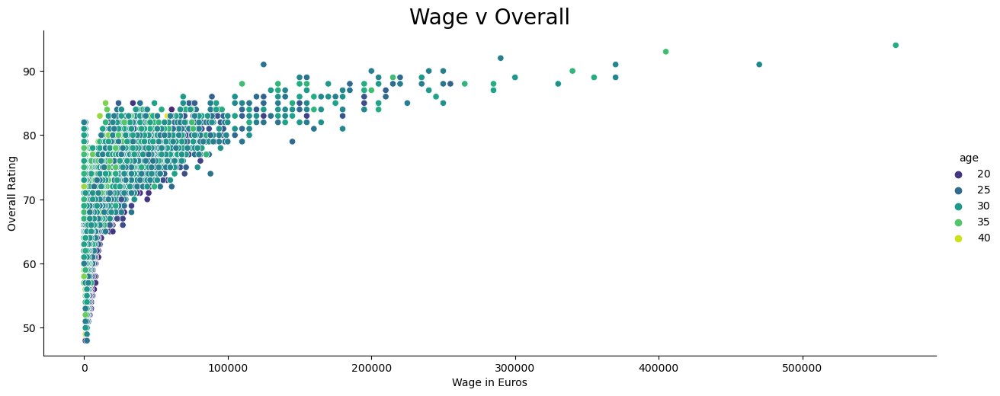

In [253]:
sns.relplot(x='wage_eur',y='overall',hue='age',palette = 'viridis', aspect=2.5,data=data)
plt.title('Wage v Overall',fontsize = 20)
plt.xlabel('Wage in Euros')
plt.ylabel('Overall Rating')
plt.show()

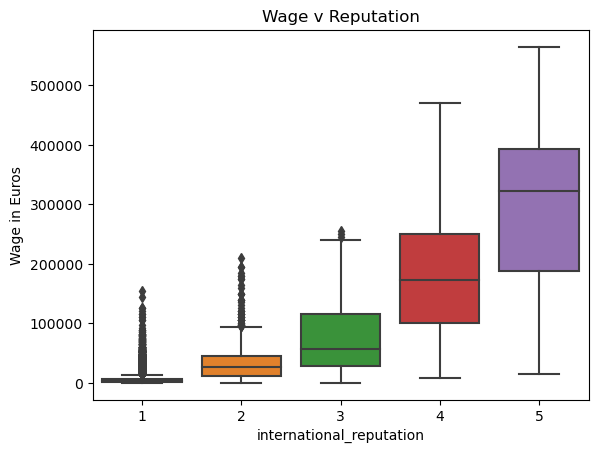

In [254]:
sns.boxplot(y='wage_eur',x='international_reputation',data=data)
plt.title('Wage v Reputation')
plt.ylabel('Wage in Euros')
plt.xlabel('international_reputation')
plt.show()

In [255]:
fig = px.scatter_3d(top_rated.head(20), x='potential', y='overall', z='wage_eur',
              color='short_name')
fig.update_layout(title='3D Plot of Potential, Overall and Wage')
fig.show()

#### Correlation Heatmap

<Axes: >

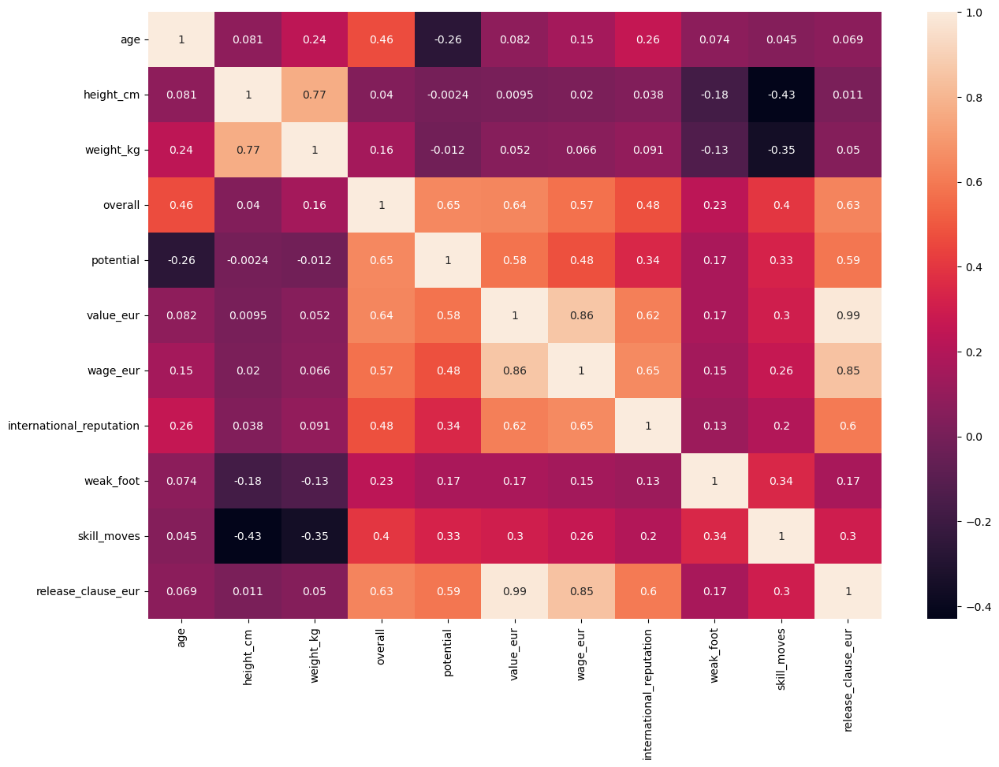

In [256]:
plt.figure(figsize=(15,10))
sns.heatmap(dataset1.corr(), annot=True, cbar=True)

### Clustering

In [257]:
# Import the fifa dataset
fifa=pd.read_csv('fifa_20.csv')
fifa

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


In [258]:
cdata = fifa[['sofifa_id','age', 'height_cm', 'weight_kg', 'overall', 'potential',
'value_eur', 'wage_eur', 'international_reputation', 'weak_foot',
'skill_moves', 'release_clause_eur', 'team_jersey_number',
'contract_valid_until', 'nation_jersey_number', 'pace', 'shooting',
'passing', 'dribbling', 'defending', 'physic', 'gk_diving',
'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed',
'gk_positioning', 'attacking_crossing', 'attacking_finishing',
'attacking_heading_accuracy', 'attacking_short_passing',
'attacking_volleys', 'skill_dribbling', 'skill_curve',
'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
'movement_reactions', 'movement_balance', 'power_shot_power',
'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
'mentality_aggression', 'mentality_interceptions',
'mentality_positioning', 'mentality_vision', 'mentality_penalties',
'mentality_composure', 'defending_marking', 'defending_standing_tackle',
'defending_sliding_tackle', 'goalkeeping_diving',
'goalkeeping_handling', 'goalkeeping_kicking',
'goalkeeping_positioning', 'goalkeeping_reflexes']]

In [259]:
cdata

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,158023,32,170,72,94,94,95500000,565000,5,4,...,75,96,33,37,26,6,11,15,14,8
1,20801,34,187,83,93,93,58500000,405000,5,4,...,85,95,28,32,24,7,11,15,14,11
2,190871,27,175,68,92,92,105500000,290000,5,5,...,90,94,27,26,29,9,9,15,15,11
3,200389,26,188,87,91,93,77500000,125000,3,3,...,11,68,27,12,18,87,92,78,90,89
4,183277,28,175,74,91,91,90000000,470000,4,4,...,88,91,34,27,22,11,12,6,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,22,186,79,48,56,40000,2000,1,3,...,39,41,45,50,52,5,5,13,5,14
18274,250995,22,177,66,48,56,40000,2000,1,2,...,37,35,42,53,57,13,6,14,11,9
18275,252332,19,186,75,48,56,40000,1000,1,2,...,36,39,46,52,46,7,8,10,6,14
18276,251110,18,185,74,48,54,40000,1000,1,2,...,36,40,39,44,54,14,9,13,13,13


In [260]:
# Import KMeans Algorithm from Scikit-learn library
from sklearn.cluster import KMeans


# Initialise the model with K as 3
model = KMeans(n_clusters=6, random_state=10)

#Training the model
model.fit(cdata)

KMeans(n_clusters=6, random_state=10)

In [261]:
cdata.shape

(18278, 61)

In [262]:
# centroids of the clusters
model.cluster_centers_

array([[2.22521213e+05, 2.49606150e+01, 1.81332350e+02, 7.50489329e+01,
        6.36535383e+01, 6.95731536e+01, 6.81159787e+05, 3.55805953e+03,
        1.02323785e+00, 2.88381073e+00, 2.23020219e+00, 1.21408986e+06,
        2.08569924e+01, 2.02098512e+03, 1.27779416e+01, 6.65068801e+01,
        4.92848919e+01, 5.43520079e+01, 5.97865066e+01, 4.97714125e+01,
        6.32906487e+01, 6.42179865e+01, 6.20447908e+01, 6.09733221e+01,
        6.53117102e+01, 3.70014743e+01, 6.22464195e+01, 4.69175793e+01,
        4.26885004e+01, 4.99462932e+01, 5.58248385e+01, 3.98654170e+01,
        5.25212721e+01, 4.41998034e+01, 4.01171019e+01, 4.99002387e+01,
        5.53698399e+01, 6.29382196e+01, 6.30324347e+01, 6.19526116e+01,
        5.87973182e+01, 6.30657821e+01, 5.52181971e+01, 6.39311289e+01,
        6.08042685e+01, 6.40369278e+01, 4.35185341e+01, 5.33166947e+01,
        4.41755125e+01, 4.70873350e+01, 5.07116681e+01, 4.61916596e+01,
        5.53387391e+01, 4.47952822e+01, 4.57478236e+01, 4.399283

In [263]:
# Set colours to the clusters to differentiate(Not required in main impelemntation)
color_scheme = np.array(['red','blue','green','yellow','pink','cyan'])

In [264]:
color_scheme

array(['red', 'blue', 'green', 'yellow', 'pink', 'cyan'], dtype='<U6')

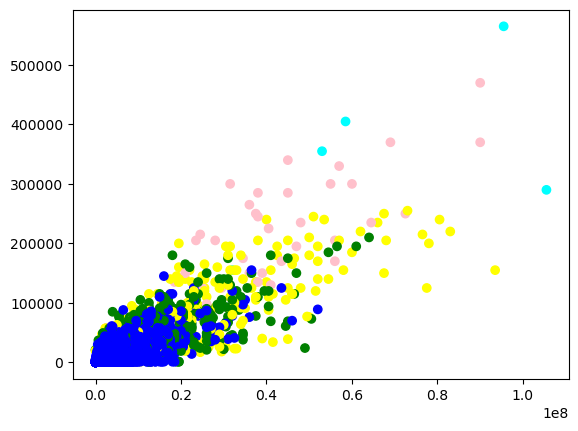

In [265]:
# Visualize the clusters in the original data(Not required in main impelemntation)
plt.scatter(cdata.value_eur,cdata.wage_eur,color=color_scheme[cdata.international_reputation])

In [266]:
model.labels_

array([2, 2, 2, ..., 0, 0, 0])

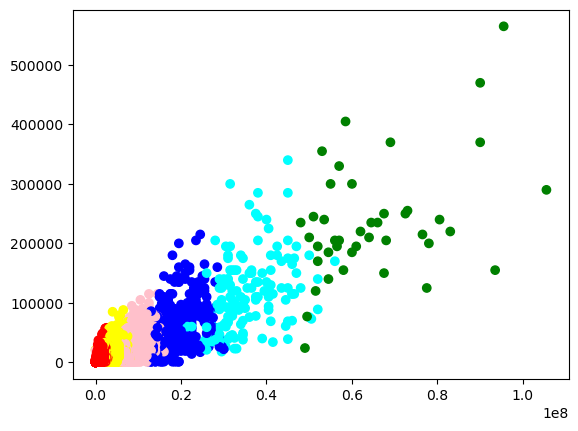

In [267]:
# visualize the clusters formed by the model(Not required in main impelemntation)
plt.scatter(cdata.value_eur,cdata.wage_eur,color=color_scheme[model.labels_]);

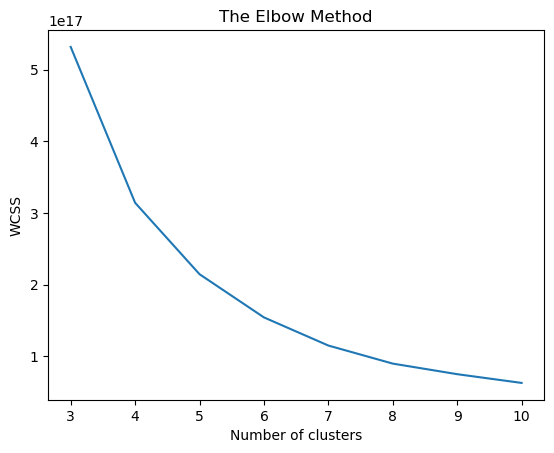

In [268]:
#elbow method
from sklearn.cluster import KMeans
wcss=[]
for i in range (3,11):
    kmeans=KMeans(n_clusters=i,random_state=42)
    kmeans.fit(cdata)
    wcss.append(kmeans.inertia_)
plt.plot(range(3,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [269]:
label=model.labels_
label

from sklearn.metrics import silhouette_score
score=silhouette_score(cdata,label)
score 

0.7474786784055435

## Task3:- Explore the data and attempt all the below asked questions in a step by step manner:


In [270]:
fifa = pd.read_csv('fifa_20.csv')

In [271]:
fifa

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


### ● Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?

In [272]:
# Name of top countries and the number of players in each countries
fifa['nationality'].value_counts()

England                1667
Germany                1216
Spain                  1035
France                  984
Argentina               886
                       ... 
Liberia                   1
São Tomé & Príncipe       1
Puerto Rico               1
Bahrain                   1
Indonesia                 1
Name: nationality, Length: 162, dtype: int64

In [273]:
# Top 10 countries and number of players in each country.
fifa['nationality'].value_counts()[0:10]

England        1667
Germany        1216
Spain          1035
France          984
Argentina       886
Brazil          824
Italy           732
Colombia        591
Japan           453
Netherlands     416
Name: nationality, dtype: int64

In [274]:
# Top 10 countries having most number of players
list(fifa['nationality'].value_counts()[0:10].keys())

['England',
 'Germany',
 'Spain',
 'France',
 'Argentina',
 'Brazil',
 'Italy',
 'Colombia',
 'Japan',
 'Netherlands']

In [275]:
# Number of the players in the top 10 countries having most number of players. 
list(fifa['nationality'].value_counts()[0:10])

[1667, 1216, 1035, 984, 886, 824, 732, 591, 453, 416]

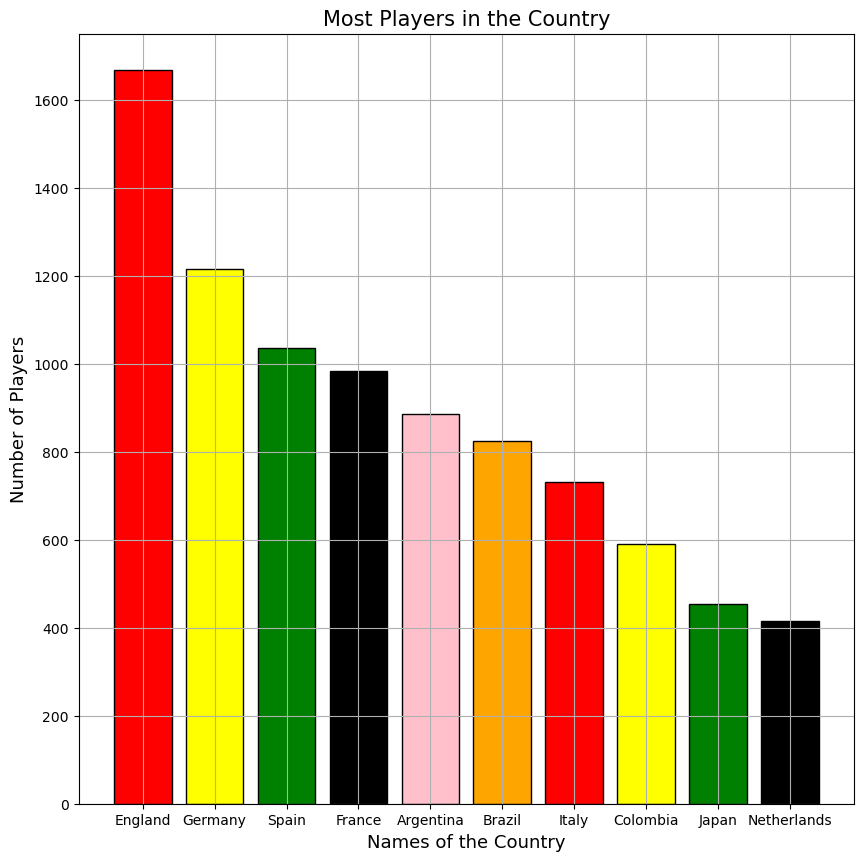

In [276]:
# Bar-plot of top 10 countries with most number of players.
plt.figure(figsize=(10,10))
plt.bar(list(fifa['nationality'].value_counts()[0:10].keys()),list(fifa['nationality'].value_counts()[0:10]),color=['red','yellow','green','black','pink','orange'],ec='black',lw=1)
plt.grid(True)
plt.title("Most Players in the Country",fontsize=15)
plt.xlabel('Names of the Country',fontsize=13)
plt.ylabel('Number of Players',fontsize=13)
plt.show()

###  ● Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?

In [277]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = fifa['age'],
    y = fifa['overall'],
    mode='markers',
    marker=dict(
        color=fifa['overall'], 
        showscale=True
    ),
    text= fifa['short_name'],
))

fig.update_layout(title='Age vs Overall Rating',
                  xaxis_title='Age',
                  yaxis_title='Overall Rating')
fig.show()

### ● Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?

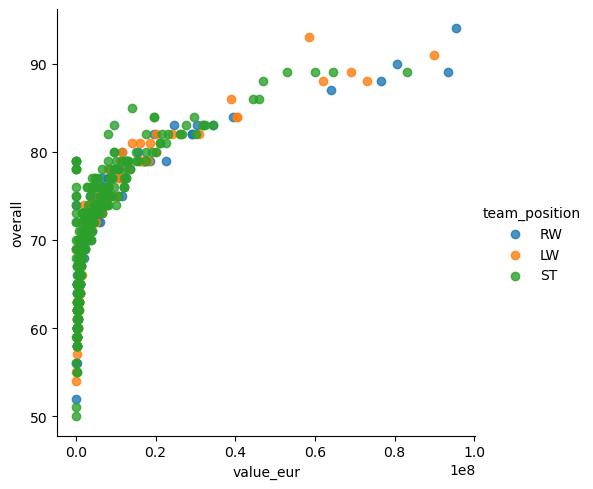

In [278]:
sns.lmplot(x='value_eur', y='overall', hue='team_position', 
           data=fifa.loc[fifa['team_position'].isin(['ST', 'RW', 'LW'])], 
           fit_reg=False)

## Model Creation

In [279]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
fifa = pd.read_csv('fifa_20.csv')
fifa.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [280]:
fifa.isnull().sum()

sofifa_id     0
player_url    0
short_name    0
long_name     0
age           0
             ..
lb            0
lcb           0
cb            0
rcb           0
rb            0
Length: 104, dtype: int64

In [281]:
fifa.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


In [282]:
fifa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


In [283]:
fifa.dtypes

sofifa_id      int64
player_url    object
short_name    object
long_name     object
age            int64
               ...  
lb            object
lcb           object
cb            object
rcb           object
rb            object
Length: 104, dtype: object

### Label Encoding

In [284]:
import re

def extract_numeric_id(url):
    match = re.search(r'/(\d+)/', url)
    if match:
        return int(match.group(1))
    else:
        return None

fifa['player_url'] = fifa['player_url'].apply(extract_numeric_id)

In [285]:
name_to_int = {name: i for i, name in enumerate(fifa['short_name'].unique())}
fifa['short_name'] = fifa['short_name'].map(name_to_int)

In [286]:
name_to_int = {name: i for i, name in enumerate(fifa['long_name'].unique())}
fifa['long_name'] = fifa['long_name'].map(name_to_int)

In [287]:
fifa['dob'] = pd.to_datetime(fifa['dob'])
fifa['year_of_birth'] = fifa['dob'].dt.year.astype(int)
fifa['month_of_birth'] = fifa['dob'].dt.month.astype(int)
fifa['day_of_birth'] = fifa['dob'].dt.day.astype(int)

In [288]:
fifa['dob'] = fifa['dob'].dt.year.astype(int)

In [289]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
fifa['nationality'] = label_encoder.fit_transform(fifa['nationality'])

In [290]:
fifa['nationality'] = fifa['nationality'].apply(int)

In [291]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
fifa['club'] = label_encoder.fit_transform(fifa['club'])

In [292]:
fifa['club'] = fifa['club'].apply(int)

In [293]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
fifa['player_positions'] = label_encoder.fit_transform(fifa['player_positions'])

In [294]:
fifa['player_positions'] = fifa['player_positions'].apply(int)

In [295]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
fifa['preferred_foot'] = label_encoder.fit_transform(fifa['preferred_foot'])

In [296]:
fifa['preferred_foot'] = fifa['preferred_foot'].apply(int)

In [297]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
fifa['work_rate'] = label_encoder.fit_transform(fifa['work_rate'])
fifa['body_type'] = label_encoder.fit_transform(fifa['body_type'])
fifa['real_face'] = label_encoder.fit_transform(fifa['real_face'])

In [298]:
fifa['work_rate'] = fifa['work_rate'].apply(int)
fifa['body_type'] = fifa['body_type'].apply(int)
fifa['real_face'] = fifa['real_face'].apply(int)

In [299]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
fifa['nation_position'] = label_encoder.fit_transform(fifa['nation_position'])
fifa['player_traits'] = label_encoder.fit_transform(fifa['player_traits'])
fifa['player_tags'] = label_encoder.fit_transform(fifa['player_tags'])
fifa['team_position'] = label_encoder.fit_transform(fifa['team_position'])
fifa['loaned_from'] = label_encoder.fit_transform(fifa['loaned_from'])
fifa['joined'] = label_encoder.fit_transform(fifa['joined'])

In [300]:
fifa['nation_position'] = fifa['nation_position'].apply(int)
fifa['player_traits'] = fifa['player_traits'].apply(int)
fifa['player_tags'] = fifa['player_tags'].apply(int)
fifa['team_position'] = fifa['team_position'].apply(int)
fifa['loaned_from'] = fifa['loaned_from'].apply(int)
fifa['joined'] = fifa['joined'].apply(int)

In [301]:
from sklearn.preprocessing import LabelEncoder

columns_to_encode = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram',
                    'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm',
                     'rwb', 'lb', 'lcb','cb', 'rcb', 'rb']

label_encoder = LabelEncoder()

for column in columns_to_encode:
    fifa[column] = label_encoder.fit_transform(fifa[column])

In [302]:
fifa['ls'] = fifa['ls'].apply(int)
fifa['st'] = fifa['st'].apply(int)
fifa['rs'] = fifa['rs'].apply(int)
fifa['lw'] = fifa['lw'].apply(int)
fifa['lf'] = fifa['lf'].apply(int)
fifa['cf'] = fifa['cf'].apply(int)
fifa['rf'] = fifa['rf'].apply(int)
fifa['rw'] = fifa['rw'].apply(int)
fifa['lam'] = fifa['lam'].apply(int)
fifa['cam'] = fifa['cam'].apply(int)
fifa['ram'] = fifa['ram'].apply(int)
fifa['lm'] = fifa['lm'].apply(int)
fifa['lcm'] = fifa['lcm'].apply(int)
fifa['cm'] = fifa['cm'].apply(int)
fifa['rcm'] = fifa['rcm'].apply(int)
fifa['rm'] = fifa['rm'].apply(int)
fifa['lwb'] = fifa['lwb'].apply(int)
fifa['ldm'] = fifa['ldm'].apply(int)
fifa['cdm'] = fifa['cdm'].apply(int)
fifa['rdm'] = fifa['rdm'].apply(int)
fifa['rwb'] = fifa['rwb'].apply(int)
fifa['lb'] = fifa['lb'].apply(int)
fifa['lcb'] = fifa['lcb'].apply(int)
fifa['cb'] = fifa['cb'].apply(int)
fifa['rcb'] = fifa['rcb'].apply(int)
fifa['rb'] = fifa['rb'].apply(int)

In [303]:
fifa.dtypes

sofifa_id         int64
player_url        int64
short_name        int64
long_name         int64
age               int64
                  ...  
rcb               int64
rb                int64
year_of_birth     int32
month_of_birth    int32
day_of_birth      int32
Length: 107, dtype: object

In [304]:
data = pd.DataFrame(fifa)
data.head(20)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,rdm,rwb,lb,lcb,cb,rcb,rb,year_of_birth,month_of_birth,day_of_birth
0,158023,158023,0,0,32,1987,170,72,5,224,...,58,63,52,38,38,38,52,1987,6,24
1,20801,20801,1,1,34,1985,187,83,121,350,...,49,57,49,42,42,42,49,1985,2,5
2,190871,190871,2,2,27,1992,175,68,18,462,...,49,59,49,27,27,27,49,1992,2,5
3,200389,200389,3,3,26,1993,188,87,133,63,...,49,59,49,27,27,27,49,1993,1,7
4,183277,183277,4,4,28,1991,175,74,12,505,...,53,59,49,33,33,33,49,1991,1,7
5,192985,192985,5,5,28,1991,181,70,12,400,...,82,82,74,69,69,69,74,1991,6,28
6,192448,192448,6,6,27,1992,187,85,57,224,...,82,82,74,69,69,69,74,1992,4,30
7,203376,203376,7,7,27,1991,193,92,108,389,...,93,86,90,109,109,109,90,1991,7,8
8,177003,177003,8,8,33,1985,172,66,34,505,...,90,90,86,81,81,81,86,1985,9,9
9,209331,209331,9,9,27,1992,175,71,43,389,...,61,68,60,50,50,50,60,1992,6,15


In [305]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 107 entries, sofifa_id to day_of_birth
dtypes: float64(16), int32(4), int64(87)
memory usage: 14.6 MB


In [306]:
data.describe()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,rdm,rwb,lb,lcb,cb,rcb,rb,year_of_birth,month_of_birth,day_of_birth
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,219738.864482,8496.398348,9103.820166,25.283291,1993.294179,181.362184,75.276343,74.997483,346.163968,...,40.106795,40.821644,39.839315,46.305777,46.305777,46.305777,39.839315,1993.294179,5.852446,15.665937
std,27960.200461,27960.200461,5026.260747,5257.274387,4.656964,4.658668,6.756961,7.047744,47.086559,201.055571,...,19.168597,17.887759,18.627146,23.367971,23.367971,23.367971,18.627146,4.658668,3.447486,8.890365
min,768.000000,768.000000,0.000000,0.000000,16.000000,1977.000000,156.000000,50.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1977.000000,1.000000,1.000000
25%,204445.500000,204445.500000,4116.250000,4550.250000,22.000000,1990.000000,177.000000,70.000000,38.000000,174.000000,...,24.000000,27.000000,25.000000,26.000000,26.000000,26.000000,25.000000,1990.000000,3.000000,8.000000
50%,226165.000000,226165.000000,8409.500000,9101.500000,25.000000,1994.000000,181.000000,75.000000,57.000000,346.000000,...,39.000000,42.000000,40.000000,49.000000,49.000000,49.000000,40.000000,1994.000000,6.000000,16.000000
75%,240795.750000,240795.750000,12837.750000,13654.750000,29.000000,1997.000000,186.000000,80.000000,123.000000,519.000000,...,54.000000,54.000000,54.000000,66.000000,66.000000,66.000000,54.000000,1997.000000,9.000000,23.000000
max,252905.000000,252905.000000,17353.000000,18217.000000,42.000000,2002.000000,205.000000,110.000000,161.000000,697.000000,...,97.000000,97.000000,95.000000,109.000000,109.000000,109.000000,95.000000,2002.000000,12.000000,31.000000


In [307]:
data.fillna(method='ffill', inplace=True)

### Train-Test-Split

In [308]:
## Creating independent and dependent variable
X = data.drop('international_reputation', axis=1)#independent variable 
y = data.international_reputation#dependent variable 

In [309]:
data.international_reputation.value_counts()

1    16794
2     1140
3      292
4       46
5        6
Name: international_reputation, dtype: int64

In [310]:
## preparing training and testing data
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [311]:
X_train

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,rdm,rwb,lb,lcb,cb,rcb,rb,year_of_birth,month_of_birth,day_of_birth
13495,227966,227966,1280,13464,22,1997,190,80,129,90,...,42,50,48,43,43,43,48,1997,1,5
542,195086,195086,541,542,29,1989,188,84,34,389,...,73,67,71,94,94,94,71,1989,7,5
10157,222329,222329,9781,10142,22,1996,174,60,120,173,...,27,34,30,28,28,28,30,1996,8,28
11221,220197,220197,10784,11199,22,1996,185,72,45,575,...,50,44,46,61,61,61,46,1996,11,1
1071,229636,229636,1063,1071,24,1995,188,76,155,457,...,39,44,38,38,38,38,38,1995,6,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,229756,229756,10843,11262,23,1996,188,78,57,210,...,37,38,44,61,61,61,44,1996,4,7
11964,192643,192643,11479,11939,32,1987,173,72,57,60,...,50,46,44,53,53,53,44,1987,1,21
5390,189920,189920,5246,5388,31,1988,193,89,150,364,...,22,23,20,26,26,26,20,1988,5,12
860,220131,220131,856,860,27,1991,191,86,129,286,...,22,25,23,28,28,28,23,1991,10,28


In [312]:
X_test

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,rdm,rwb,lb,lcb,cb,rcb,rb,year_of_birth,month_of_birth,day_of_birth
11854,165502,165502,11379,11829,32,1987,183,79,45,515,...,21,18,15,28,28,28,15,1987,6,24
2647,245850,245850,1166,2646,30,1988,186,80,78,539,...,71,69,69,80,80,80,69,1988,9,16
5945,229692,229692,5779,5943,25,1994,185,80,57,529,...,50,44,38,45,45,45,38,1994,4,15
6798,241025,241025,6596,6795,22,1996,185,79,5,67,...,27,31,25,26,26,26,25,1996,10,11
12985,202295,202295,12438,12955,30,1988,191,83,85,186,...,21,18,15,20,20,20,15,1988,11,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13684,222221,222221,13093,13653,25,1993,190,84,124,261,...,42,34,38,57,57,57,38,1993,10,31
7453,199159,199159,7220,7446,29,1990,175,65,7,615,...,60,56,52,59,59,59,52,1990,3,8
15695,225067,225067,14968,15654,23,1996,173,68,123,170,...,18,21,18,13,13,13,18,1996,1,22
17583,246173,246173,16721,17530,17,2002,185,78,45,483,...,22,27,28,36,36,36,28,2002,4,16


In [313]:
from sklearn.impute import SimpleImputer

# Create an imputer object with mean strategy
imputer = SimpleImputer(strategy='mean')

# Fit the imputer on the training data
imputer.fit(X_train)

# Transform the training and testing data with imputed values
X_train= imputer.transform(X_train)
X_test= imputer.transform(X_test)

### Balancing Data

In [314]:
from imblearn.over_sampling import SMOTE                 #for balancing the data
sm=SMOTE(random_state=42,k_neighbors=2)                                               #object creation
X_sm,y_sm = sm.fit_resample(X_train,y_train)

In [315]:
from collections import Counter                
print(Counter(y_train))
print(Counter(y_sm))

Counter({1: 13414, 2: 931, 3: 235, 4: 39, 5: 3})
Counter({1: 13414, 2: 13414, 3: 13414, 4: 13414, 5: 13414})


### Decision Tree

In [316]:
from sklearn.tree import DecisionTreeClassifier   #importing decision tree from sklearn.tree
dt = DecisionTreeClassifier()                     #object creation for decision tree  
dt.fit(X_sm,y_sm)                                 #training the model

DecisionTreeClassifier()

In [317]:
y_hat=dt.predict(X_test)     #prediction
y_hat                        #predicted values 

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [318]:
y_train_predict = dt.predict(X_train)#predicting training data to check training performance 
y_train_predict

array([1, 2, 1, ..., 1, 1, 1], dtype=int64)

In [319]:
y_train_predict_sm = dt.predict(X_sm)#predicting training data to check training performance 
y_train_predict_sm

array([1, 2, 1, ..., 5, 5, 5], dtype=int64)

In [320]:
## Evalauting the model
from sklearn.metrics import accuracy_score,classification_report,f1_score#importing mertics to check model performance

acc_train = accuracy_score(y_train, y_train_predict)#checking accuracy
acc_train

1.0

In [321]:
acc_train_sm = accuracy_score(y_sm, y_train_predict_sm)#checking accuracy
acc_train_sm

1.0

In [322]:
print(classification_report(y_train,y_train_predict))# it will give precision,recall,f1 scores and accuracy  

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     13414
           2       1.00      1.00      1.00       931
           3       1.00      1.00      1.00       235
           4       1.00      1.00      1.00        39
           5       1.00      1.00      1.00         3

    accuracy                           1.00     14622
   macro avg       1.00      1.00      1.00     14622
weighted avg       1.00      1.00      1.00     14622



In [323]:
pd.crosstab(y_train,y_train_predict)#it will show you confusion matrix

col_0,1,2,3,4,5
international_reputation,,,,,
1,13414,0,0,0,0
2,0,931,0,0,0
3,0,0,235,0,0
4,0,0,0,39,0
5,0,0,0,0,3


In [324]:
## test acc
test_acc=accuracy_score(y_test,y_hat)#testing accuracy 
test_acc

0.9141137855579868

In [325]:
## test score
test_f1 = f1_score(y_test, y_hat, average='weighted')
test_f1

0.9179532865344799

In [326]:
print(classification_report(y_test,y_hat))# for  testing 

              precision    recall  f1-score   support

           1       0.97      0.95      0.96      3380
           2       0.36      0.44      0.40       209
           3       0.37      0.39      0.38        57
           4       0.09      0.14      0.11         7
           5       0.00      0.00      0.00         3

    accuracy                           0.91      3656
   macro avg       0.36      0.39      0.37      3656
weighted avg       0.92      0.91      0.92      3656



In [327]:
pd.crosstab(y_test,y_hat)# confusion matrix for

col_0,1,2,3,4
international_reputation,,,,
1,3226,141,13,0
2,95,93,20,1
3,9,19,22,7
4,0,3,3,1
5,0,0,1,2


### Random Forest

In [328]:
from sklearn.ensemble import RandomForestClassifier  #importing randomforest

rf_clf = RandomForestClassifier(n_estimators=100)  #object creation ,taking 100 decision tree in random forest 
rf_clf.fit(X_sm,y_sm)   #training the data

RandomForestClassifier()

In [329]:
y_predict = rf_clf.predict(X_test)#testing

In [330]:
y_predict_train = rf_clf.predict(X_train)

In [331]:
f_Score=f1_score(y_test,y_predict, average='weighted')
f_Score

0.9369368001889884

In [332]:
from sklearn.metrics import classification_report, f1_score
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           1       0.98      0.97      0.97      3380
           2       0.47      0.56      0.51       209
           3       0.57      0.47      0.52        57
           4       0.25      0.29      0.27         7
           5       0.00      0.00      0.00         3

    accuracy                           0.94      3656
   macro avg       0.45      0.46      0.45      3656
weighted avg       0.94      0.94      0.94      3656



In [333]:
print(classification_report(y_train,y_predict_train))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     13414
           2       1.00      1.00      1.00       931
           3       1.00      1.00      1.00       235
           4       1.00      1.00      1.00        39
           5       1.00      1.00      1.00         3

    accuracy                           1.00     14622
   macro avg       1.00      1.00      1.00     14622
weighted avg       1.00      1.00      1.00     14622



### Gradient Boosting

In [334]:
## importing the model library
from sklearn.ensemble import GradientBoostingClassifier
gbm = GradientBoostingClassifier() ## object creation
gbm.fit(X_train,y_train) ## fitting the data

GradientBoostingClassifier()

In [335]:
y_gbm = gbm.predict(X_test)#predicting the price

In [336]:
y_gbm_train = gbm.predict(X_train)

In [337]:
## evaluatin the model
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score,classification_report# to check model performance
accu_scor = accuracy_score(y_test,y_gbm)
accu_scor

0.9472100656455142

In [338]:
accu_scor_train = accuracy_score(y_train, y_gbm_train)
accu_scor_train

0.9718232799890576

In [339]:
print(classification_report(y_train, y_gbm_train))

              precision    recall  f1-score   support

           1       0.98      0.99      0.99     13414
           2       0.84      0.70      0.76       931
           3       0.99      0.88      0.93       235
           4       1.00      1.00      1.00        39
           5       1.00      1.00      1.00         3

    accuracy                           0.97     14622
   macro avg       0.96      0.91      0.94     14622
weighted avg       0.97      0.97      0.97     14622



In [340]:
print(classification_report(y_test,y_gbm))

              precision    recall  f1-score   support

           1       0.97      0.98      0.98      3380
           2       0.57      0.52      0.54       209
           3       0.61      0.49      0.54        57
           4       0.50      0.57      0.53         7
           5       0.50      0.33      0.40         3

    accuracy                           0.95      3656
   macro avg       0.63      0.58      0.60      3656
weighted avg       0.94      0.95      0.95      3656



### Support Vector Machines

In [341]:
from sklearn.svm import SVC
svclassifier = SVC() ## base model with default parameters

In [342]:
svclassifier.fit(X_sm, y_sm)

SVC()

In [343]:
# Predict output for X_test

y_hat=svclassifier.predict(X_test)

In [344]:
## evaluating the model created
from sklearn.metrics import accuracy_score,recall_score,precision_score,classification_report,f1_score
acc=accuracy_score(y_test,y_hat)
acc

0.8285010940919038

In [345]:
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support

           1       0.98      0.86      0.91      3380
           2       0.20      0.56      0.29       209
           3       0.21      0.23      0.22        57
           4       0.19      0.71      0.29         7
           5       0.06      0.33      0.10         3

    accuracy                           0.83      3656
   macro avg       0.32      0.54      0.36      3656
weighted avg       0.92      0.83      0.87      3656



In [346]:
cm1=pd.crosstab(y_test,y_hat)
cm1

col_0,1,2,3,4,5
international_reputation,,,,,
1,2894,456,24,3,3
2,57,116,25,6,5
3,5,19,13,11,9
4,1,0,1,5,0
5,0,0,0,2,1


In [347]:
# F1 score considers both Precision and Recall for evaluating a model
f1=f1_score(y_test,y_hat, average='weighted')
f1

0.8650113335341177

### KNN

In [348]:
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt

In [349]:
error_rate = []
# Will take some time
for i in range(1,11):
    KNN = KNeighborsClassifier(n_neighbors=i)
    KNN.fit(X_train,y_train)
    pred_i = KNN.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

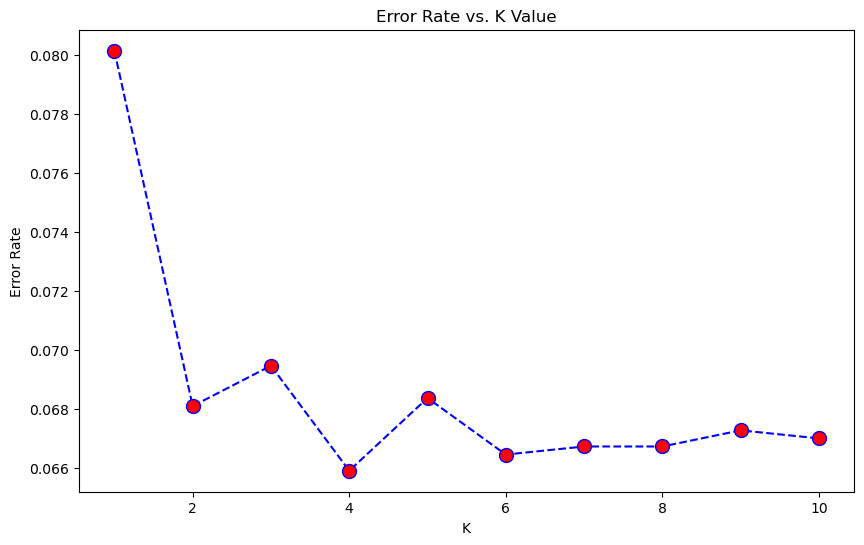

In [350]:
plt.figure(figsize=(10,6))
plt.plot(range(1,11),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [351]:
KNN=KNeighborsClassifier(n_neighbors=7)

KNN.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=7)

In [352]:
y_predict_KNN=KNN.predict(X_test)

In [353]:
from sklearn.metrics import f1_score,accuracy_score,recall_score,precision_score,classification_report

y_train_KNN=KNN.predict(X_train)
f1_train=f1_score(y_train,y_train_KNN,average='weighted')
f1_train

0.9212580293126775

In [354]:
## Checking the outputs
f1_KNN=f1_score(y_test,y_predict_KNN,average='weighted')
f1_KNN

0.9221939422607788

In [355]:
print(classification_report(y_test,y_predict_KNN))

              precision    recall  f1-score   support

           1       0.95      0.99      0.97      3380
           2       0.48      0.29      0.36       209
           3       0.54      0.23      0.32        57
           4       0.00      0.00      0.00         7
           5       0.00      0.00      0.00         3

    accuracy                           0.93      3656
   macro avg       0.39      0.30      0.33      3656
weighted avg       0.92      0.93      0.92      3656



### Bagging

In [356]:
from sklearn.ensemble import BaggingClassifier

model_bagg = BaggingClassifier(base_estimator=KNN, n_estimators=20)

model_bagg.fit(X_train,y_train)

y_hat_bagg = model_bagg.predict(X_test)

In [357]:
y_hat_training = model_bagg.predict(X_train)

In [358]:
f1_bagg_train = f1_score(y_train,y_hat_training,average='weighted')
f1_bagg_train

0.9239668954555661

In [359]:
f1_bagg = f1_score(y_test,y_hat_bagg,average='weighted')

In [360]:
f1_bagg

0.9244934394782689

In [361]:
print(classification_report(y_test,y_hat_bagg))

              precision    recall  f1-score   support

           1       0.96      0.99      0.97      3380
           2       0.51      0.31      0.39       209
           3       0.44      0.25      0.31        57
           4       0.00      0.00      0.00         7
           5       0.00      0.00      0.00         3

    accuracy                           0.93      3656
   macro avg       0.38      0.31      0.33      3656
weighted avg       0.92      0.93      0.92      3656



### Logistics Regression

In [362]:
from sklearn.linear_model import LogisticRegression

In [363]:
LR=LogisticRegression()
LR.fit(X_train,y_train)

LogisticRegression()

In [364]:
LR_y_train_predict=LR.predict(X_train)
LR_y_train_predict

array([1, 2, 1, ..., 1, 1, 1], dtype=int64)

In [365]:
ac_train=accuracy_score(y_train,LR_y_train_predict)
ac_train

0.9257967446313774

In [366]:
LR_y_predict=LR.predict(X_test)
LR_y_predict

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [367]:
ac_train=accuracy_score(y_test,LR_y_predict)
ac_train

0.9321663019693655

In [368]:
print(classification_report(y_test,LR_y_predict))

              precision    recall  f1-score   support

           1       0.95      0.99      0.97      3380
           2       0.44      0.17      0.25       209
           3       0.56      0.32      0.40        57
           4       0.00      0.00      0.00         7
           5       0.00      0.00      0.00         3

    accuracy                           0.93      3656
   macro avg       0.39      0.30      0.32      3656
weighted avg       0.91      0.93      0.92      3656



### XGB-Boosting

In [369]:
import xgboost 

In [370]:
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier

# Encode the classes in y_train
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Create and fit the XGBoost classifier
xgb_r = XGBClassifier()
xgb_r.fit(X_train, y_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [371]:
from sklearn.metrics import f1_score,accuracy_score,recall_score,precision_score,classification_report

In [372]:
y_hat = xgb_r.predict(X_test)

In [373]:
y_hat_train = xgb_r.predict(X_train)

In [374]:
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.23      0.01      0.02      3380
           2       0.25      0.05      0.08       209
           3       0.40      0.07      0.12        57
           4       0.00      0.00      0.00         7
           5       0.00      0.00      0.00         3

    accuracy                           0.01      3656
   macro avg       0.15      0.02      0.04      3656
weighted avg       0.24      0.01      0.03      3656



In [375]:
print(classification_report(y_train, y_hat_train))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       0.0
           1       0.00      0.00      0.00   13414.0
           2       0.00      0.00      0.00     931.0
           3       0.00      0.00      0.00     235.0
           4       0.00      0.00      0.00      39.0
           5       0.00      0.00      0.00       3.0

    accuracy                           0.00   14622.0
   macro avg       0.00      0.00      0.00   14622.0
weighted avg       0.00      0.00      0.00   14622.0



#### Hypertuning XG-Boosting

In [376]:
print(y.unique())

[5 3 4 2 1]


In [377]:
class_mapping = {1: 0, 2: 1, 3: 2, 4: 3, 5: 4}
Y = y.map(class_mapping)

In [378]:
from sklearn.model_selection import train_test_split, GridSearchCV
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Define the XGBoost classifier
xgb_classifier = XGBClassifier()

# Perform hyperparameter tuning using GridSearchCV
param_grid = {'n_estimators': [100, 200, 300], 'max_depth': [3, 4, 5]}  # Specify the hyperparameters to tune
grid_search = GridSearchCV(estimator=xgb_classifier, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search.fit(X, Y)

# Get the best hyperparameters and retrain the model
best_params = grid_search.best_params_
xgb_classifier = XGBClassifier(**best_params)
xgb_classifier.fit(X, Y)

# Make predictions on the test set
y_pred = xgb_classifier.predict(X_test)

# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [379]:
y_hat = xgb_r.predict(X_test)

In [380]:
y_hat_train = xgb_r.predict(X_train)

In [381]:
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3380
           1       0.61      0.50      0.55       209
           2       0.65      0.46      0.54        57
           3       0.40      0.57      0.47         7
           4       0.00      0.00      0.00         3

    accuracy                           0.95      3656
   macro avg       0.53      0.50      0.51      3656
weighted avg       0.94      0.95      0.95      3656



In [382]:
print(classification_report(y_train, y_hat_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13414
           1       1.00      1.00      1.00       931
           2       1.00      1.00      1.00       235
           3       1.00      1.00      1.00        39
           4       1.00      1.00      1.00         3

    accuracy                           1.00     14622
   macro avg       1.00      1.00      1.00     14622
weighted avg       1.00      1.00      1.00     14622



### Naive Bayes

In [383]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report

In [384]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [385]:
# Create the Naive Bayes classifier
naive_bayes = GaussianNB()

# Train the model
naive_bayes.fit(X_train, y_train)

GaussianNB()

In [386]:
y_pred = naive_bayes.predict(X_test)

In [387]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8968818380743983


In [388]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           1       0.99      0.92      0.95      3380
           2       0.34      0.68      0.45       209
           3       0.33      0.37      0.35        57
           4       0.25      0.57      0.35         7
           5       0.00      0.00      0.00         3

    accuracy                           0.90      3656
   macro avg       0.38      0.51      0.42      3656
weighted avg       0.94      0.90      0.91      3656



* The decision tree model achieved an accuracy score of 0.9, indicating that it correctly classified 90% of the instances in the test set.
* The random forest model demonstrated a high accuracy score of 0.94, signifying that it accurately predicted the class labels for 94% of the instances in the test set.
* The gradient boosting model achieved an impressive accuracy score of 0.95, indicating its ability to accurately classify instances in the test set with a high level of precision, achieving a 95% accuracy rate.
* Despite applying hyperparameter tuning to enhance the performance of the support vector machines (SVM) model, the accuracy score only improved marginally from 0.83 to 0.8. This suggests that the chosen hyperparameters did not have a substantial positive impact on the model's ability to accurately classify instances in the test set.
* The k-nearest neighbors (KNN) classifier achieved an impressive accuracy score of 0.93, demonstrating its effectiveness in accurately predicting the class labels for the test instances.
* The bagging ensemble method achieved an impressive accuracy score of 0.93, indicating its effectiveness in improving the performance of the base model. By combining multiple classifiers and aggregating their predictions, bagging demonstrated its ability to enhance the overall accuracy of the classification model on the test dataset.
* The logistic regression model achieved an impressive accuracy score of 0.93, indicating its strong performance in accurately predicting the target variable. This high accuracy suggests that the model effectively learned the underlying patterns and relationships in the data, enabling it to make accurate predictions on unseen instances.
* After applying hyperparameter tuning to the XGBoost model, the initial accuracy score of 0.01 significantly improved to 0.95. This indicates that the selected hyperparameters effectively enhanced the model's performance, resulting in a substantial increase in its ability to accurately classify instances in the test set. The tuning process successfully optimized the XGBoost model and resulted in a highly accurate classifier.
* The Naive Bayes classifier achieved an accuracy score of 0.9, indicating that it successfully classified 90% of the instances in the test set correctly.

# Conclusion

* The gradient boosting model and the XGBoost model performed exceptionally well, achieving accuracy scores of 0.95. These models demonstrated the highest accuracy rates among all the models evaluated, indicating their superior ability to accurately classify instances in the test set.

* The random forest model also demonstrated a high accuracy score of 0.94, further highlighting its effectiveness in accurately predicting class labels for the test instances.

* The k-nearest neighbors (KNN) classifier, bagging ensemble method, and logistic regression model achieved accuracy scores of 0.93. These models exhibited strong performance and accurately predicted the target variable with a high level of precision.

* The decision tree model and the Naive Bayes classifier achieved accuracy scores of 0.9, indicating their capability to correctly classify 90% of the instances in the test set.

* Despite hyperparameter tuning, the support vector machines (SVM) model's accuracy score only marginally improved from 0.83 to 0.8. This suggests that the chosen hyperparameters did not significantly enhance the model's ability to accurately classify instances in the test set.

**Considering the accuracy scores and overall performance, the gradient boosting model, XGBoost model, and random forest model can be considered as the better fit models for the FIFA 20 project. These models consistently demonstrated high accuracy rates, indicating their strong predictive capabilities and effectiveness in classifying instances accurately.**